In [1]:
here::i_am("rna_atac/diff_edge_SCENIC.ipynb")
suppressMessages(library(igraph))
suppressMessages(library(ComplexHeatmap))
suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(destiny))
suppressMessages(library(GGally))
suppressMessages(library(igraph))
suppressMessages(library(network))
suppressMessages(library(sna))
# suppressMessages(library(intergraph))
suppressMessages(library(ggraph))
suppressMessages(library(tibble))
suppressMessages(library(tidygraph))
# Load default settings
source(here::here("settings.R"))
source(here::here("utils.R"))

set.seed(42)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘destiny’ was built under R version 4.1.3”
Warning message:
“package ‘network’ was built under R version 4.1.3”
Warning message:
“package ‘sna’ was built under R version 4.1.3”
Warning message:
“package ‘statnet.common’ was built under R version 4.1.3”
Warning message:
“package ‘tidygraph’ was built under R version 4.1.3”


In [2]:
list.files(file.path(io$basedir, 'results/atac/archR/pseudobulk/celltype_genotype/PeakMatrix_atlas'))

[1] "cell2replicate.txt.gz"                                
[2] "PeakMatrix_atlas_pseudobulk_with_replicates.rds"      
[3] "pseudobulk_PeakMatrix_atlas_summarized_experiment.rds"
[4] "stats.txt"

In [3]:
#####################
## Define settings ##
#####################

# args$rna_cells.sce <- io$rna.sce
args = list()
args$metadata <- file.path(io$basedir,"results/rna/mapping/sample_metadata_after_mapping.txt.gz")
args$outdir <- file.path(io$basedir,"results/rna_atac/gene_regulatory_networks/differential")

io$rna_pseudobulk.sce <- file.path(io$basedir, 'results/rna/pseudobulk/celltype_genotype/SingleCellExperiment_pseudobulk_with_replicates.rds')
io$atac_pseudobulk.sce <- file.path(io$basedir, 'results/atac/archR/pseudobulk/celltype_genotype/PeakMatrix_atlas/PeakMatrix_atlas_pseudobulk_with_replicates.rds')
io$trajectory = "epiblast_blood"

dir.create(args$outdir, showWarnings=F, recursive=T)

all_TFs = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/TFs.txt", header=F)$V1

# Options
opts$min_coef <- 0.25
opts$min_tf_score <- 0.75

if (io$trajectory=="epiblast_blood") {
  celltypes.to.plot <- c("Epiblast",
                        "Primitive_Streak" ,
                        "Nascent_mesoderm",
                        "Mixed_mesoderm",
                        "ExE_mesoderm",
                        "Allantois",
                        "Mesenchyme",
                        "Haematoendothelial_progenitors",
                        "Endothelium",
                        "Blood_progenitors_1",
                        "Blood_progenitors_2",
                        "Erythroid1",
                        "Erythroid2",
                        "Erythroid3")
}

theme_graph <- function() {
  theme_classic() +
    theme(
      axis.line = element_blank(), 
      axis.text = element_blank(),
      axis.ticks = element_blank(), 
      axis.title = element_blank(),
      legend.position = "none"
    )
}

In [4]:
# load SCENIC+ eGRN
eGRN = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/gene_regulatory_networks/scenicplus/blood/scenicplus/eRegulon_metadata_filtered.csv')

In [8]:
# Load atac data
atac_pseudobulk.sce = readRDS(io$atac_pseudobulk.sce)
celltypes=atac_pseudobulk.sce$celltype
atac_pseudobulk.sce = atac_pseudobulk.sce[,grep(paste(celltypes.to.plot,collapse="|"), celltypes)]

# load rna data
rna_pseudobulk.sce = readRDS(io$rna_pseudobulk.sce)
rna_pseudobulk.sce = rna_pseudobulk.sce[,grep(paste(celltypes.to.plot,collapse="|"), celltypes)]


In [9]:
rna_pseudobulk.sce
atac_pseudobulk.sce

class: SingleCellExperiment 
dim: 32285 110 
metadata(2): agg_pars n_cells
assays(2): counts logcounts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(110): Allantois-eomes_ko_rep1 Allantois-eomes_ko_rep2 ...
  Primitive_Streak-wt_rep4 Primitive_Streak-wt_rep5
colData names(0):
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

class: SingleCellExperiment 
dim: 192251 110 
metadata(2): agg_pars n_cells
assays(2): counts logcounts
rownames(192251): chr1:3035602-3036202 chr1:3062653-3063253 ...
  chrX:169925487-169926087 chrX:169937064-169937664
rowData names(0):
colnames(110): Allantois-eomes_ko_rep1 Allantois-eomes_ko_rep2 ...
  Primitive_Streak-wt_rep4 Primitive_Streak-wt_rep5
colData names(3): celltype genotype celltype_genotype
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



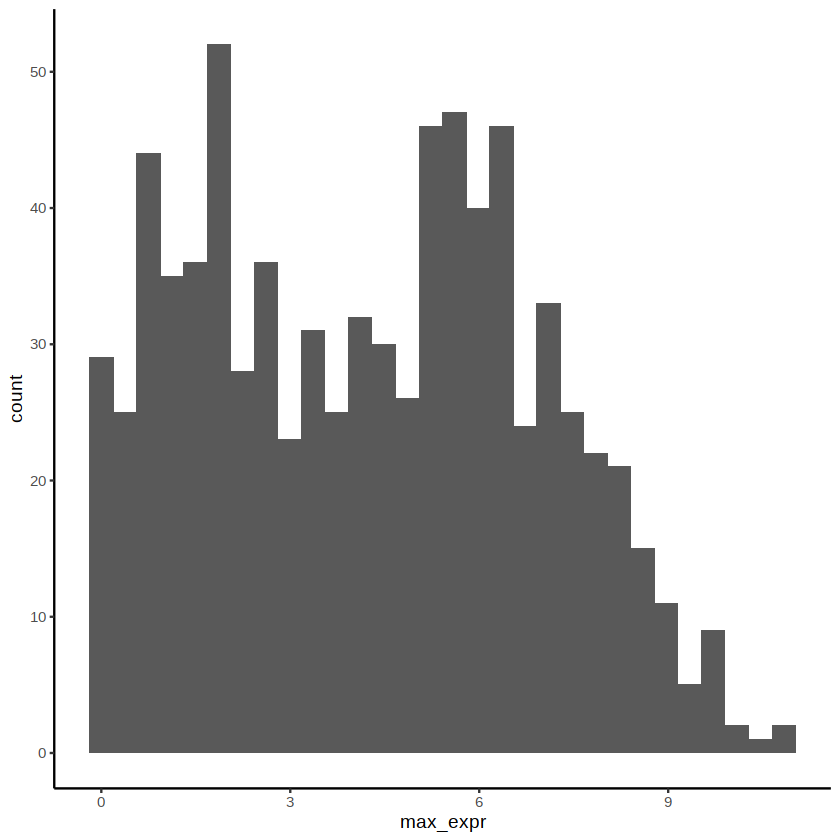

In [10]:
rna_tf_pseudobulk.mtx <- logcounts(rna_pseudobulk.sce)[intersect(str_to_title(all_TFs), rownames(rna_pseudobulk.sce)),]

max_expr = data.table(TF = rownames(rna_tf_pseudobulk.mtx), max_expr = rowMax(rna_tf_pseudobulk.mtx))
ggplot(max_expr, aes(max_expr)) + geom_histogram() + theme_classic()

In [11]:
TF_keep = max_expr[max_expr>4, TF]

Warning message:
“Using `bins = 30` by default. Pick better value with the argument `bins`.”
Warning message:
“Using `bins = 30` by default. Pick better value with the argument `bins`.”


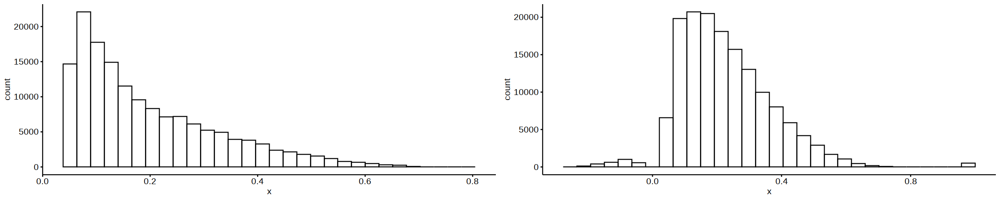

In [14]:
options(repr.plot.width=20, repr.plot.height=4)
ggarrange(gghistogram(eGRN$R2G_rho), gghistogram(eGRN$TF2G_rho))

In [15]:
eGRN_filt = eGRN[TF %in% TF_keep] %>% # filter on TFs that are expressed highly
    .[abs(R2G_rho)>0.2 & abs(TF2G_rho) > 0.2] %>%
    .[,sign:=ifelse(TF2G_rho <=0, 'Negative', 'Positive')]

In [16]:
eGRN_small = eGRN_filt[,c('TF', 'Region', 'Gene', 'TF2G_rho')]

In [59]:
genes = unique(c(eGRN_filt$TF, eGRN_filt$Gene))
regions = unique(eGRN_filt$Region)

In [92]:
# Calculate edge weight for TF-TG based on:
# expr * acc * TF2G_rho
sample = 1
GRN_pseudobulk = lapply(1:length(colnames(rna_pseudobulk.sce)), function(sample){
    expr_tmp = as.data.table(logcounts(rna_pseudobulk.sce[genes, sample]), keep.rownames=T) %>% setnames(c('Gene', 'Expr'))
    acc_tmp = as.data.table(logcounts(atac_pseudobulk.sce[regions, sample]), keep.rownames=T) %>% setnames(c('Region', 'Acc'))

    edge_values_tmp = merge(eGRN_small, expr_tmp, by.x='TF', by.y='Gene') %>% merge(., acc_tmp, by='Region') %>%
        .[,edge_weight:=Expr * Acc * TF2G_rho] %>%
        .[,`:=`(genotype=atac_pseudobulk.sce[, sample]$genotype,
                 celltype=atac_pseudobulk.sce[, sample]$celltype,
                 sample=colnames(atac_pseudobulk.sce[, sample]))]
    return(edge_values_tmp)
}) %>% rbindlist()

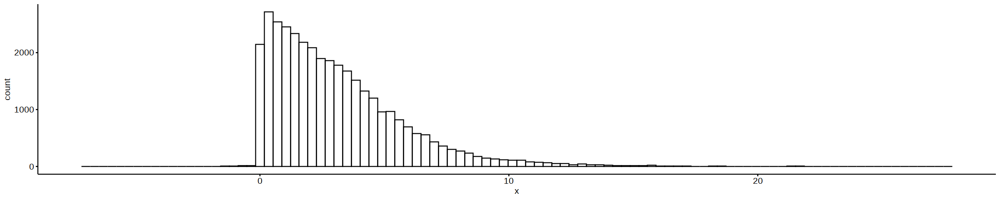

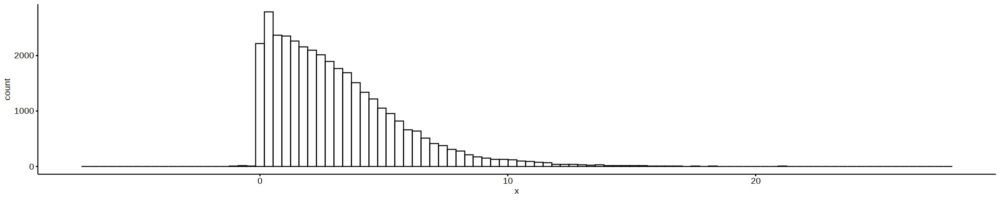

In [99]:
# Edge weight distribution
gghistogram(GRN_pseudobulk[sample == unique(sample)[1]]$edge_weight, bins=100)
gghistogram(GRN_pseudobulk[sample == unique(sample)[2]]$edge_weight, bins=100)

In [173]:
celltype_i = 'Nascent_mesoderm'
min_edgeW = 1

    GRN_pseudobulk_ko = GRN_pseudobulk[celltype==celltype_i & genotype=='eomes_ko'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]
    GRN_pseudobulk_wt = GRN_pseudobulk[celltype==celltype_i & genotype=='wt'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]

    # keep only edges above certain weight in either KO or WT
    edges_keep = rbind(GRN_pseudobulk_ko[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')],
                          GRN_pseudobulk_wt[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')]) %>%
                    unique(by=c('TF', 'Region', 'Gene')) %>% 
                    .[,idx:=.I]

    GRN_pseudobulk_ko = merge(edges_keep, GRN_pseudobulk_ko, by=c('TF', 'Region', 'Gene'))
    GRN_pseudobulk_wt = merge(edges_keep, GRN_pseudobulk_wt, by=c('TF', 'Region', 'Gene'))

In [175]:
#lapply(unique(edges_keep$idx), function(x){
edge_stats = lapply(unique(edges_keep$idx), function(x){
    ko_tmp = GRN_pseudobulk_ko[idx==x, edge_weight]
    wt_tmp = GRN_pseudobulk_wt[idx==x, edge_weight]

    tmp = data.table(TF = GRN_pseudobulk_ko[idx==x, TF][1], 
                     Region = GRN_pseudobulk_ko[idx==x, Region][1], 
                     Gene = GRN_pseudobulk_ko[idx==x, Gene][1], 
                     logFC = log2(abs(mean(ko_tmp)) / abs(mean(wt_tmp))),
                     pvalue =  t.test(ko_tmp, wt_tmp, alternative ="two.sided")$p.value)
}) %>% rbindlist() %>%
     .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
     .[order(FDR)] %>%
     .[,sig:=ifelse(FDR<0.05 & abs(logFC)>2, TRUE, FALSE)] %>%
     .[,logFC_capped:=ifelse(logFC<=-4, -4, ifelse(logFC>=4, 4, logFC))]

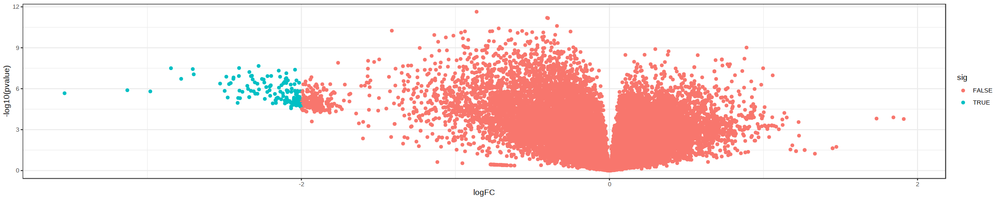

In [181]:
ggplot(edge_stats, aes(logFC, -log10(FDR), col=sig)) + 
    geom_point() +
    theme_bw()

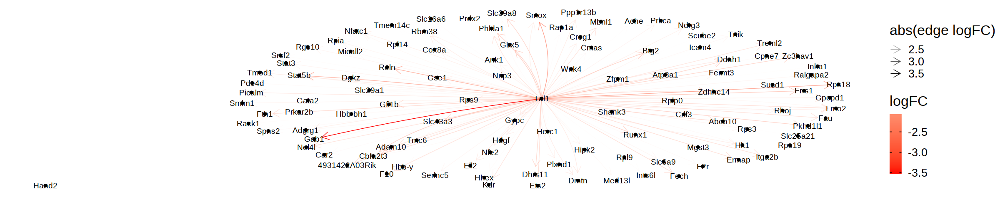

In [180]:
igraph.tbl_tmp = tbl_graph(edges =  edge_stats[sig==TRUE, c('TF', 'Gene', 'logFC')])


ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes( edge_color=logFC, alpha=abs(logFC)), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1), name='abs(edge logFC)') +
        scale_edge_colour_gradient2(low='red', mid='white', high='darkgreen') +
        # Nodes
        geom_node_point() + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(label=name)) + # , size=3.75| type=='target'
        # theme
        theme_graph() + theme(
                legend.position = "right",
                text=element_text(size=20))

# Different calculations

In [186]:
eGRN_small = eGRN_filt[,c('TF', 'Region', 'Gene', 'TF2G_importance')]

In [187]:
genes = unique(c(eGRN_filt$TF, eGRN_filt$Gene))
regions = unique(eGRN_filt$Region)

In [188]:
# Calculate edge weight for TF-TG based on:
# expr * acc * TF2G_importance
sample = 1
GRN_pseudobulk = lapply(1:length(colnames(rna_pseudobulk.sce)), function(sample){
    expr_tmp = as.data.table(logcounts(rna_pseudobulk.sce[genes, sample]), keep.rownames=T) %>% setnames(c('Gene', 'Expr'))
    acc_tmp = as.data.table(logcounts(atac_pseudobulk.sce[regions, sample]), keep.rownames=T) %>% setnames(c('Region', 'Acc'))

    edge_values_tmp = merge(eGRN_small, expr_tmp, by.x='TF', by.y='Gene') %>% merge(., acc_tmp, by='Region') %>%
        .[,edge_weight:=Expr * Acc * TF2G_importance] %>%
        .[,`:=`(genotype=atac_pseudobulk.sce[, sample]$genotype,
                 celltype=atac_pseudobulk.sce[, sample]$celltype,
                 sample=colnames(atac_pseudobulk.sce[, sample]))]
    return(edge_values_tmp)
}) %>% rbindlist()

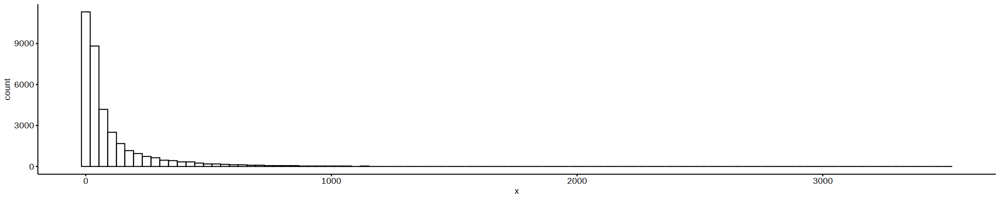

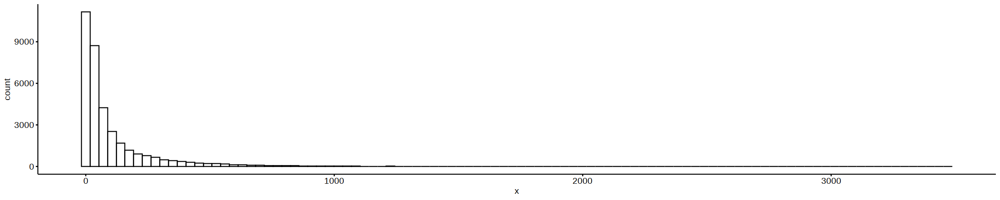

In [189]:
# Edge weight distribution
gghistogram(GRN_pseudobulk[sample == unique(sample)[1]]$edge_weight, bins=100)
gghistogram(GRN_pseudobulk[sample == unique(sample)[2]]$edge_weight, bins=100)

In [190]:
celltype_i = 'Nascent_mesoderm'
min_edgeW = 1

    GRN_pseudobulk_ko = GRN_pseudobulk[celltype==celltype_i & genotype=='eomes_ko'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]
    GRN_pseudobulk_wt = GRN_pseudobulk[celltype==celltype_i & genotype=='wt'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]

    # keep only edges above certain weight in either KO or WT
    edges_keep = rbind(GRN_pseudobulk_ko[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')],
                          GRN_pseudobulk_wt[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')]) %>%
                    unique(by=c('TF', 'Region', 'Gene')) %>% 
                    .[,idx:=.I]

    GRN_pseudobulk_ko = merge(edges_keep, GRN_pseudobulk_ko, by=c('TF', 'Region', 'Gene'))
    GRN_pseudobulk_wt = merge(edges_keep, GRN_pseudobulk_wt, by=c('TF', 'Region', 'Gene'))

In [191]:
#lapply(unique(edges_keep$idx), function(x){
edge_stats = lapply(unique(edges_keep$idx), function(x){
    ko_tmp = GRN_pseudobulk_ko[idx==x, edge_weight]
    wt_tmp = GRN_pseudobulk_wt[idx==x, edge_weight]

    tmp = data.table(TF = GRN_pseudobulk_ko[idx==x, TF][1], 
                     Region = GRN_pseudobulk_ko[idx==x, Region][1], 
                     Gene = GRN_pseudobulk_ko[idx==x, Gene][1], 
                     logFC = log2(abs(mean(ko_tmp)) / abs(mean(wt_tmp))),
                     pvalue =  t.test(ko_tmp, wt_tmp, alternative ="two.sided")$p.value)
}) %>% rbindlist() %>%
     .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
     .[order(FDR)] %>%
     .[,sig:=ifelse(FDR<0.05 & abs(logFC)>2, TRUE, FALSE)] %>%
     .[,logFC_capped:=ifelse(logFC<=-4, -4, ifelse(logFC>=4, 4, logFC))]

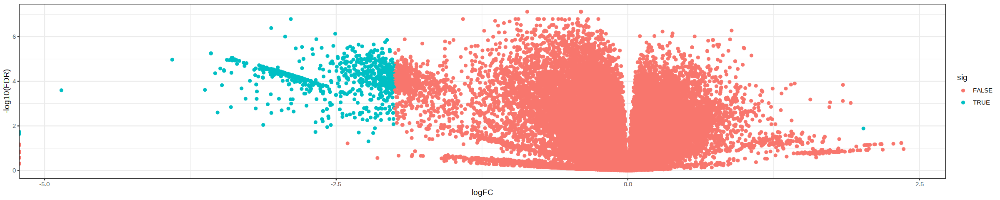

In [192]:
ggplot(edge_stats, aes(logFC, -log10(FDR), col=sig)) + 
    geom_point() +
    theme_bw()

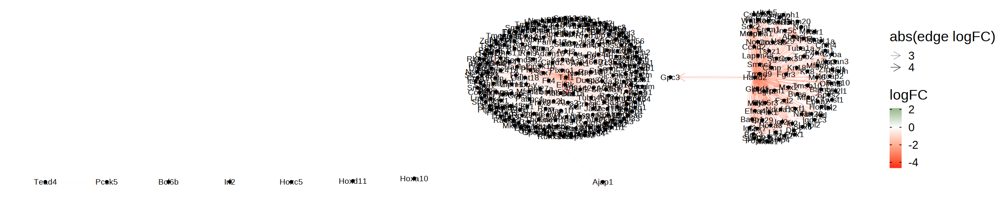

In [193]:
igraph.tbl_tmp = tbl_graph(edges =  edge_stats[sig==TRUE, c('TF', 'Gene', 'logFC')])


ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes( edge_color=logFC, alpha=abs(logFC)), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1), name='abs(edge logFC)') +
        scale_edge_colour_gradient2(low='red', mid='white', high='darkgreen') +
        # Nodes
        geom_node_point() + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(label=name)) + # , size=3.75| type=='target'
        # theme
        theme_graph() + theme(
                legend.position = "right",
                text=element_text(size=20))

# Different calculations

In [17]:
eGRN_small = eGRN_filt[,c('TF', 'Region', 'Gene', 'TF2G_importance')]

In [18]:
genes = unique(c(eGRN_filt$TF, eGRN_filt$Gene))
regions = unique(eGRN_filt$Region)

In [19]:
# Calculate edge weight for TF-TG based on:
# expr * acc * TF2G_importance
sample = 1
GRN_pseudobulk = lapply(1:length(colnames(rna_pseudobulk.sce)), function(sample){
    expr_tmp = as.data.table(logcounts(rna_pseudobulk.sce[genes, sample]), keep.rownames=T) %>% setnames(c('Gene', 'Expr'))
    acc_tmp = as.data.table(logcounts(atac_pseudobulk.sce[regions, sample]), keep.rownames=T) %>% setnames(c('Region', 'Acc'))

    edge_values_tmp = merge(eGRN_small, expr_tmp, by.x='TF', by.y='Gene') %>% merge(., acc_tmp, by='Region') %>%
        .[,edge_weight:=Expr * Acc] %>%
        .[,`:=`(genotype=atac_pseudobulk.sce[, sample]$genotype,
                 celltype=atac_pseudobulk.sce[, sample]$celltype,
                 sample=colnames(atac_pseudobulk.sce[, sample]))]
    return(edge_values_tmp)
}) %>% rbindlist()

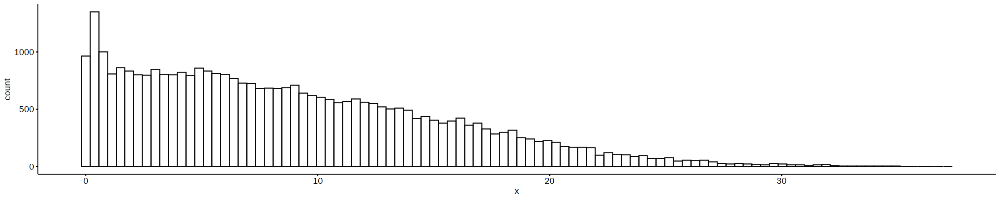

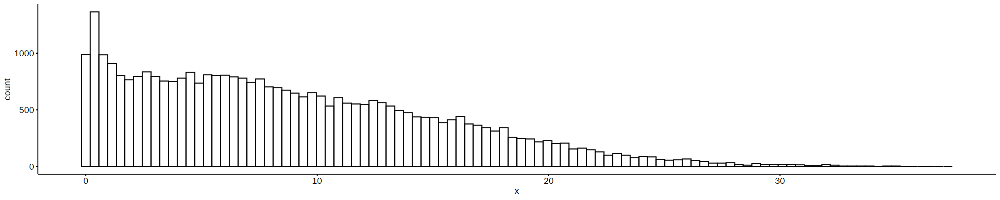

In [20]:
# Edge weight distribution
gghistogram(GRN_pseudobulk[sample == unique(sample)[1]]$edge_weight, bins=100)
gghistogram(GRN_pseudobulk[sample == unique(sample)[2]]$edge_weight, bins=100)

In [21]:
celltype_i = 'Allantois'
min_edgeW = 1

    GRN_pseudobulk_ko = GRN_pseudobulk[celltype==celltype_i & genotype=='eomes_ko'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]
    GRN_pseudobulk_wt = GRN_pseudobulk[celltype==celltype_i & genotype=='wt'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]

    # keep only edges above certain weight in either KO or WT
    edges_keep = rbind(GRN_pseudobulk_ko[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')],
                          GRN_pseudobulk_wt[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')]) %>%
                    unique(by=c('TF', 'Region', 'Gene')) %>% 
                    .[,idx:=.I]

    GRN_pseudobulk_ko = merge(edges_keep, GRN_pseudobulk_ko, by=c('TF', 'Region', 'Gene'))
    GRN_pseudobulk_wt = merge(edges_keep, GRN_pseudobulk_wt, by=c('TF', 'Region', 'Gene'))

In [22]:
#lapply(unique(edges_keep$idx), function(x){
edge_stats = lapply(unique(edges_keep$idx), function(x){
    ko_tmp = GRN_pseudobulk_ko[idx==x, edge_weight]
    wt_tmp = GRN_pseudobulk_wt[idx==x, edge_weight]

    tmp = data.table(TF = GRN_pseudobulk_ko[idx==x, TF][1], 
                     Region = GRN_pseudobulk_ko[idx==x, Region][1], 
                     Gene = GRN_pseudobulk_ko[idx==x, Gene][1], 
                     logFC = log2(abs(mean(ko_tmp)) / abs(mean(wt_tmp))),
                     pvalue =  t.test(ko_tmp, wt_tmp, alternative ="two.sided")$p.value)
}) %>% rbindlist() %>%
     .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
     .[order(FDR)] %>%
     .[,sig:=ifelse(FDR<0.05 & abs(logFC)>2, TRUE, FALSE)] %>%
     .[,logFC_capped:=ifelse(logFC<=-4, -4, ifelse(logFC>=4, 4, logFC))]

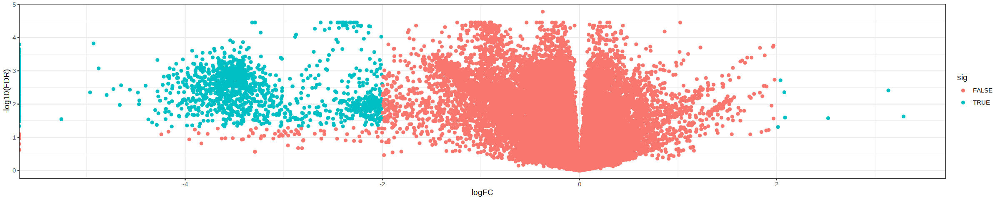

In [23]:
ggplot(edge_stats, aes(logFC, -log10(FDR), col=sig)) + 
    geom_point() +
    theme_bw()

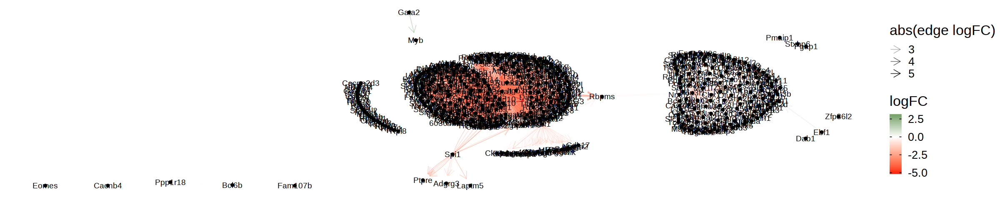

In [24]:
igraph.tbl_tmp = tbl_graph(edges =  edge_stats[sig==TRUE, c('TF', 'Gene', 'logFC')])


ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes( edge_color=logFC, alpha=abs(logFC)), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1), name='abs(edge logFC)') +
        scale_edge_colour_gradient2(low='red', mid='white', high='darkgreen') +
        # Nodes
        geom_node_point() + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(label=name)) + # , size=3.75| type=='target'
        # theme
        theme_graph() + theme(
                legend.position = "right",
                text=element_text(size=20))

# Minmax normalisation! Important to get decent results!

In [65]:
eGRN_small = eGRN_filt[,c('TF', 'Region', 'Gene', 'TF2G_rho')]

In [66]:
genes = unique(c(eGRN_filt$TF, eGRN_filt$Gene))
regions = unique(eGRN_filt$Region)

In [100]:
# Calculate edge weight for TF-TG based on:
# expr * acc * TF2G_importance
sample = 1
GRN_pseudobulk = lapply(1:length(colnames(rna_pseudobulk.sce)), function(sample){
    expr_tmp = as.data.table(logcounts(rna_pseudobulk.sce[genes, sample]), keep.rownames=T) %>% setnames(c('Gene', 'Expr'))
    acc_tmp = as.data.table(logcounts(atac_pseudobulk.sce[regions, sample]), keep.rownames=T) %>% setnames(c('Region', 'Acc'))

    edge_values_tmp = merge(eGRN_small, expr_tmp, by.x='TF', by.y='Gene') %>% merge(., acc_tmp, by='Region') %>%
        .[,edge_weight:=Expr * Acc * TF2G_rho] %>%
        .[,`:=`(genotype=atac_pseudobulk.sce[, sample]$genotype,
                 celltype=atac_pseudobulk.sce[, sample]$celltype,
                 sample=colnames(atac_pseudobulk.sce[, sample]))] %>%
        merge(.,expr_tmp %>% setnames(c('Gene', 'Gene_Expr')), by='Gene')
    return(edge_values_tmp)
}) %>% rbindlist()

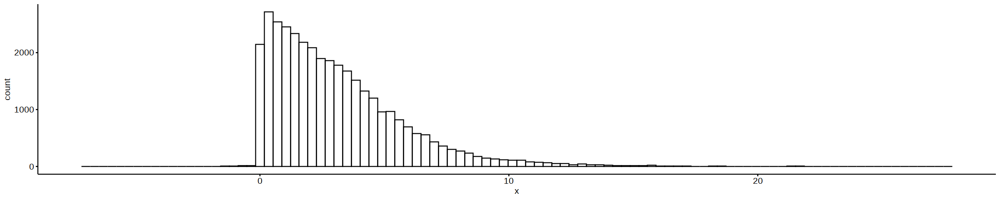

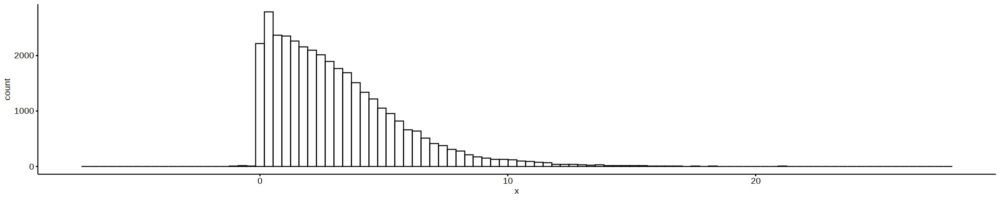

In [68]:
# Edge weight distribution
gghistogram(GRN_pseudobulk[sample == unique(sample)[1]]$edge_weight, bins=100)
gghistogram(GRN_pseudobulk[sample == unique(sample)[2]]$edge_weight, bins=100)

In [101]:
GRN_pseudobulk = GRN_pseudobulk[, `:=`(Expr_minmax=(Expr-min(Expr))/(max(Expr)-min(Expr)),
                             Acc_minmax=(Acc-min(Acc))/(max(Acc)-min(Acc)),
                             Gene_Expr_minmax=(Gene_Expr-min(Gene_Expr))/(max(Gene_Expr)-min(Gene_Expr))),
                             by='Gene'] %>%
                    .[,edge_weight:=Expr_minmax*Acc_minmax]

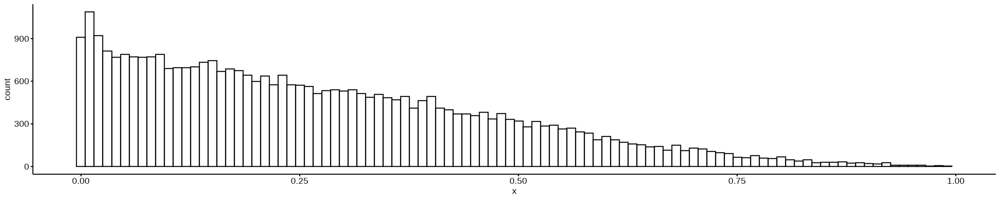

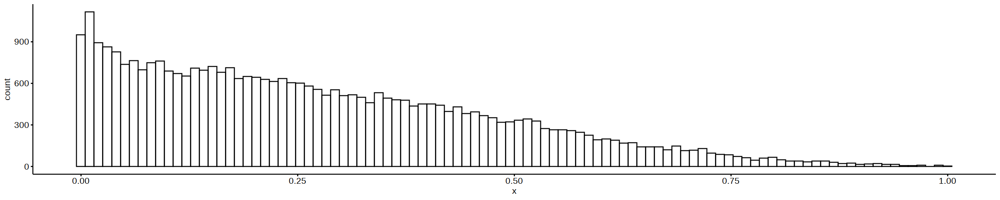

In [104]:
# Edge weight distribution
gghistogram(GRN_pseudobulk[sample == unique(sample)[1]]$edge_weight, bins=100)
gghistogram(GRN_pseudobulk[sample == unique(sample)[2]]$edge_weight, bins=100)

In [105]:
rna_pseudobulk.sce

class: SingleCellExperiment 
dim: 32285 110 
metadata(2): agg_pars n_cells
assays(2): counts logcounts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(110): Allantois-eomes_ko_rep1 Allantois-eomes_ko_rep2 ...
  Primitive_Streak-wt_rep4 Primitive_Streak-wt_rep5
colData names(0):
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [293]:
mean_TF_expr_wt = GRN_pseudobulk_wt[,c('TF', 'Expr')] %>% 
    .[, mean_expr:=mean(Expr), by='TF'] %>% 
    .[mean_expr>4, TF] %>% unique(by='TF')

In [294]:
mean_TF_expr

[1] "Ahctf1"  "Ahr"     "Arid3b"  "Arid5b"  "Arnt"    "Atf4"    "Atf6"   
  [8] "Atf6b"   "Atf7"    "Bach2"   "Clock"   "Creb3l2" "Ctcf"    "Cux1"   
 [15] "Cux2"    "E2f4"    "E2f7"    "Elf1"    "Eomes"   "Etv1"    "Etv4"   
 [22] "Etv5"    "Etv6"    "Evx1"    "Foxj3"   "Foxk1"   "Foxn2"   "Foxn3"  
 [29] "Foxo1"   "Foxo3"   "Foxp1"   "Foxp4"   "Glis1"   "Hdx"     "Hivep1" 
 [36] "Hmbox1"  "Hmg20b"  "Hmga2"   "Jun"     "Klf12"   "Klf13"   "Klf3"   
 [43] "Klf6"    "Klf7"    "Klf9"    "Lef1"    "Mecom"   "Mef2a"   "Mga"    
 [50] "Mixl1"   "Msx1"    "Myb"     "Nanog"   "Nfat5"   "Nfe2l1"  "Nfia"   
 [57] "Nfkb1"   "Nfya"    "Nfyc"    "Otx2"    "Patz1"   "Pbx1"    "Pbx3"   
 [64] "Pbx4"    "Phf21a"  "Pitx2"   "Plag1"   "Pou2f1"  "Pou3f1"  "Pou5f1" 
 [71] "Rest"    "Rfx3"    "Rfx7"    "Rora"    "Smad1"   "Smad2"   "Smad3"  
 [78] "Sox11"   "Sox2"    "Sox4"    "Sp2"     "Sp4"     "Sp8"     "T"      
 [85] "Tbx3"    "Tcf12"   "Tcf4"    "Tcf7l1"  "Tcf7l2"  "Tead1"   "Tead2"  
 [92] "Tfdp1"   "Tfdp2"   "Thra"    "Vezf1"   "Xbp1"    "Ybx1"    "Zfp219" 
 [99] "Zfp281"  "Zfp652"  "Zfx"     "Zic2"    "Zic3"    "Zic5"    "Zscan10"

In [295]:
calc_edge_stats = function(celltype_i = 'Mixed_mesoderm', min_edgeW=0.4, TF_expr_thr=4){

    # Extract celltype-genotype GRN
    GRN_pseudobulk_ko = GRN_pseudobulk[celltype==celltype_i & genotype=='eomes_ko'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]
    GRN_pseudobulk_wt = GRN_pseudobulk[celltype==celltype_i & genotype=='wt'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]

    # Keep only TFs that are highly expressed
    mean_TF_expr_ko = GRN_pseudobulk_ko[,c('TF', 'Expr')] %>% 
        .[, mean_expr:=mean(Expr), by='TF'] %>% 
        .[mean_expr>TF_expr_thr, TF] %>% unique(by='TF')
    
    mean_TF_expr_wt = GRN_pseudobulk_wt[,c('TF', 'Expr')] %>% 
        .[, mean_expr:=mean(Expr), by='TF'] %>% 
        .[mean_expr>TF_expr_thr, TF] %>% unique(by='TF')
    
    keep_TFs = unique(c(mean_TF_expr_ko, mean_TF_expr_wt))
    GRN_pseudobulk_ko = GRN_pseudobulk_ko[TF %in% keep_TFs]
    GRN_pseudobulk_wt = GRN_pseudobulk_wt[TF %in% keep_TFs]

    
    if(nrow(GRN_pseudobulk_ko) != 0 & nrow(GRN_pseudobulk_wt) != 0){
    
    # keep only edges above certain weight in either KO or WT
    edges_keep = rbind(GRN_pseudobulk_ko[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')],
                          GRN_pseudobulk_wt[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')]) %>%
                    unique(by=c('TF', 'Region', 'Gene')) %>% 
                    .[,idx:=.I]

    GRN_pseudobulk_ko = merge(edges_keep, GRN_pseudobulk_ko, by=c('TF', 'Region', 'Gene'))
    GRN_pseudobulk_wt = merge(edges_keep, GRN_pseudobulk_wt, by=c('TF', 'Region', 'Gene'))
    
    #lapply(unique(edges_keep$idx), function(x){
    edge_stats = lapply(unique(edges_keep$idx), function(x){
    ko_tmp = GRN_pseudobulk_ko[idx==x, edge_weight]
    wt_tmp = GRN_pseudobulk_wt[idx==x, edge_weight]

    tmp = data.table(TF = GRN_pseudobulk_ko[idx==x, TF][1], 
                     Region = GRN_pseudobulk_ko[idx==x, Region][1], 
                     Gene = GRN_pseudobulk_ko[idx==x, Gene][1], 
                     logFC = log2(abs(mean(ko_tmp)) / abs(mean(wt_tmp))),
                     TF_logFC = log2(abs(mean(GRN_pseudobulk_ko[idx==x, Expr_minmax])) / abs(mean(GRN_pseudobulk_wt[idx==x, Expr_minmax]))),
                     Gene_logFC = log2(abs(mean(GRN_pseudobulk_ko[idx==x, Gene_Expr_minmax])) / abs(mean(GRN_pseudobulk_wt[idx==x, Gene_Expr_minmax]))),
                     pvalue =  t.test(ko_tmp, wt_tmp, alternative ="two.sided")$p.value)
    }) %>% rbindlist() %>%
         .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
         .[order(FDR)] %>%
         .[,sig:=ifelse(FDR<0.05 & abs(logFC)>2, TRUE, FALSE)] %>%
         .[,logFC_capped:=ifelse(logFC<=-4, -4, ifelse(logFC>=4, 4, logFC))]

        edge_stats = edge_stats[,sig:=ifelse(FDR<0.05 & abs(logFC)>0.5, TRUE, FALSE)]
        return(edge_stats)
    }
}

In [296]:
plot_network = function(edge_stats = edge_stats, layout='fr', celltype_i='Mixed_mesoderm'){
    ggplot(edge_stats, aes(logFC, -log10(FDR), col=sig)) + 
        geom_point() +
        theme_bw()
    
    edge_stats_filt = edge_stats[sig==TRUE][,N:=.N,by=TF][N>3]
    
    nodes = rbind(edge_stats_filt[,c('TF', 'TF_logFC')] %>% setnames(c('gene', 'Gene_logFC')), 
                  edge_stats_filt[,c('Gene', 'Gene_logFC')]%>% setnames(c('gene', 'Gene_logFC'))) %>%
        unique(by='gene') %>%
        .[,type:=ifelse(gene %in% str_to_title(all_TFs), 'TF', 'target')] %>%
        .[,size:=ifelse(type=='TF', 4, 1.5)] %>%
        .[,Gene_logFC:=ifelse(Gene_logFC<= -1.5, -1.5, ifelse(Gene_logFC>=1.5, 1.5, Gene_logFC))] 

    igraph.tbl_tmp = tbl_graph(edges = edge_stats_filt[, c('TF', 'Gene', 'logFC')], nodes = nodes)

    ggraph(igraph.tbl_tmp, layout) + #'fr'
        # Edges
            geom_edge_fan(aes( edge_color=logFC), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, 
            scale_edge_alpha_continuous(range=c(0,1), name='abs(edge logFC)') +
            scale_edge_colour_gradient2(low='red', mid='grey90', high='darkgreen', name='Edge LogFC') +
            # Nodes
            geom_node_point(aes(fill=Gene_logFC, size=size), shape=21) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
            geom_node_text(aes(filter=type=='TF', label=gene)) + # , size=3.75| type=='target'
            scale_fill_gradient2(low='blue', mid='white', high='orange', name='Gene LogFC') +
            scale_size_continuous(range(1,2), guide='none') + 
            # theme
            theme_graph() + theme(
                    legend.position = "right",
                    text=element_text(size=20)) + 
            ggtitle(paste(celltype_i, 'KO vs WT'))
}

In [249]:
edge_stats = calc_edge_stats('Primitive_Streak')

Epiblast

Primitive_Streak

Nascent_mesoderm

Mixed_mesoderm

ExE_mesoderm

Allantois

Mesenchyme

Haematoendothelial_progenitors

Endothelium

Blood_progenitors_1

Blood_progenitors_2

Erythroid1

Erythroid2

Erythroid3



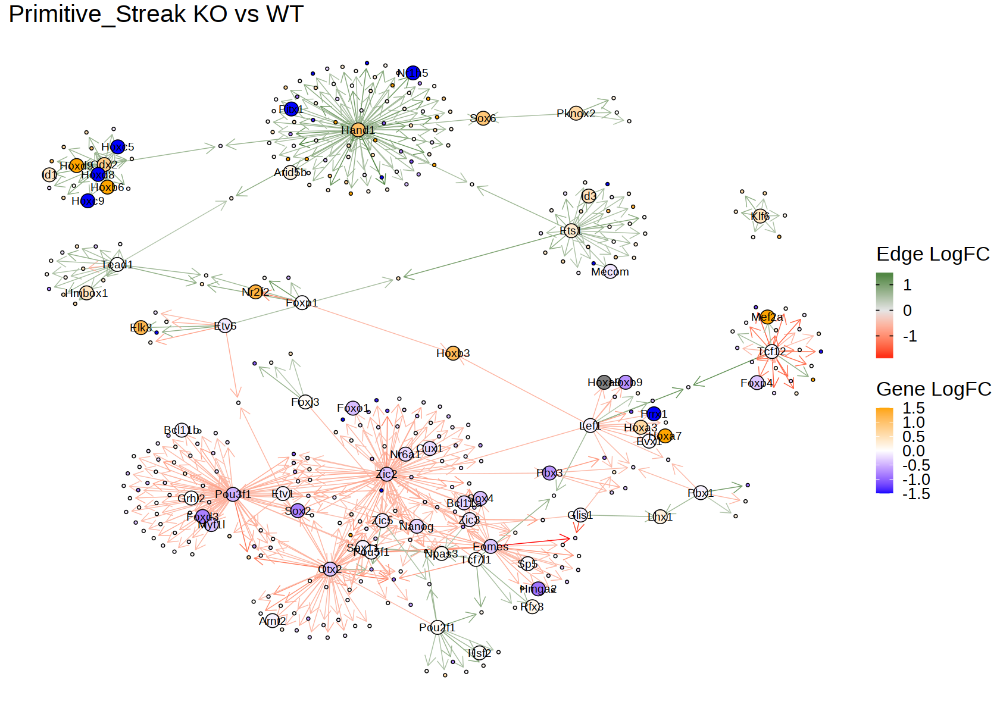

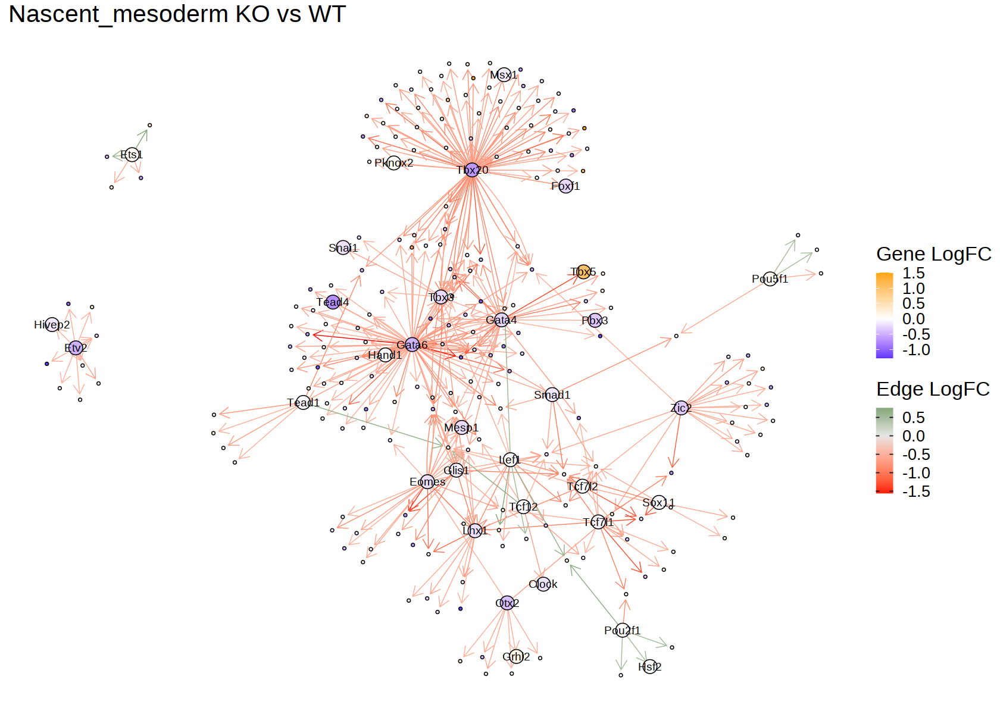

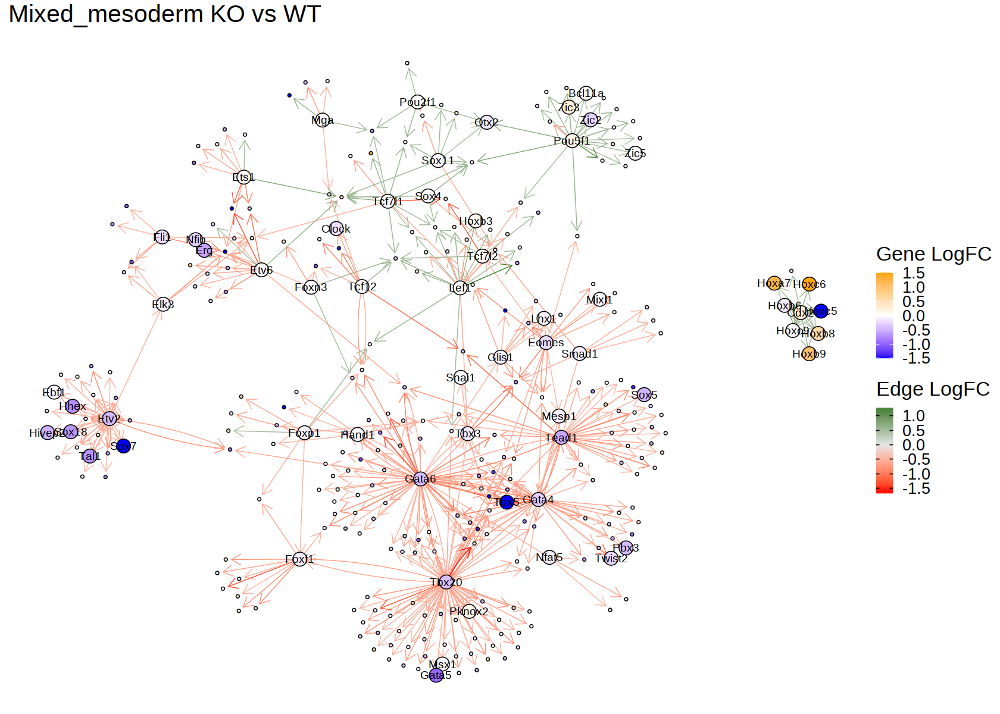

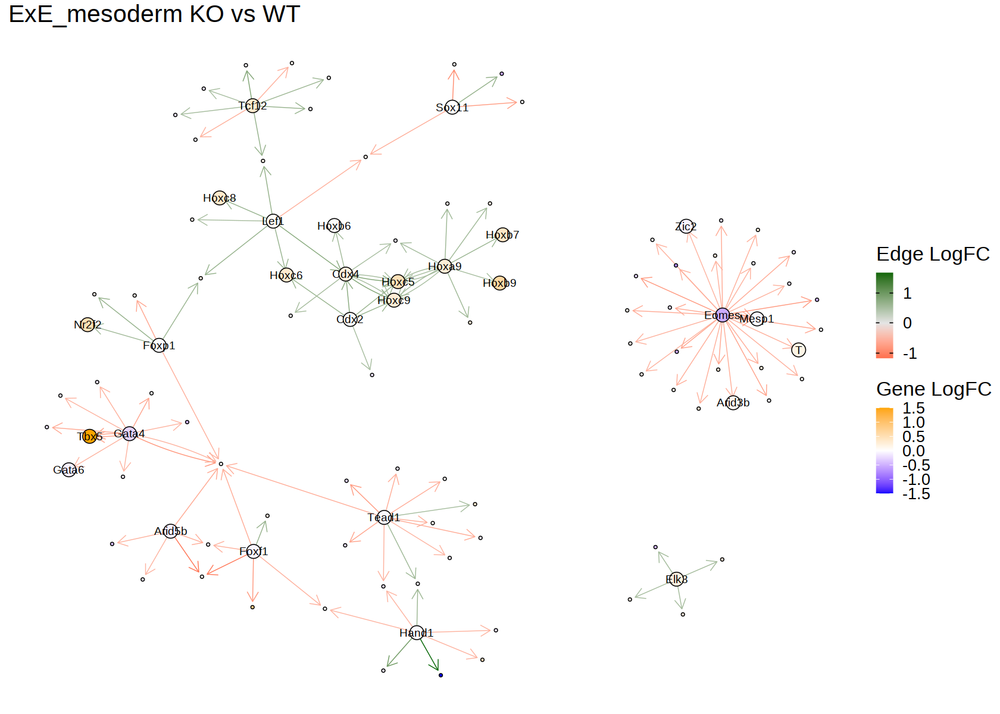

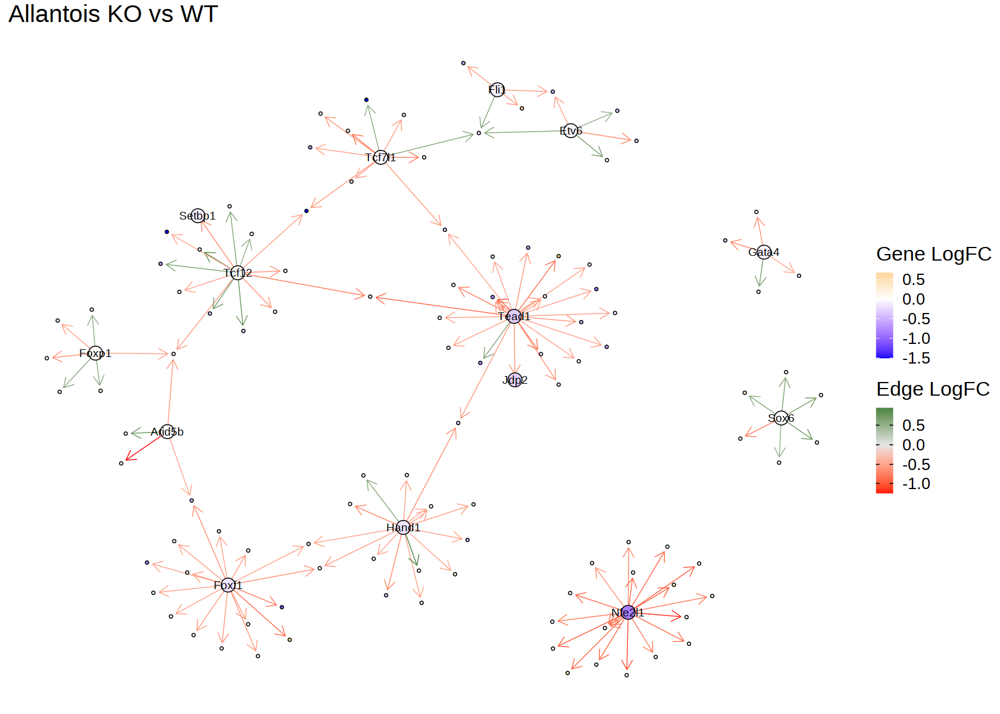

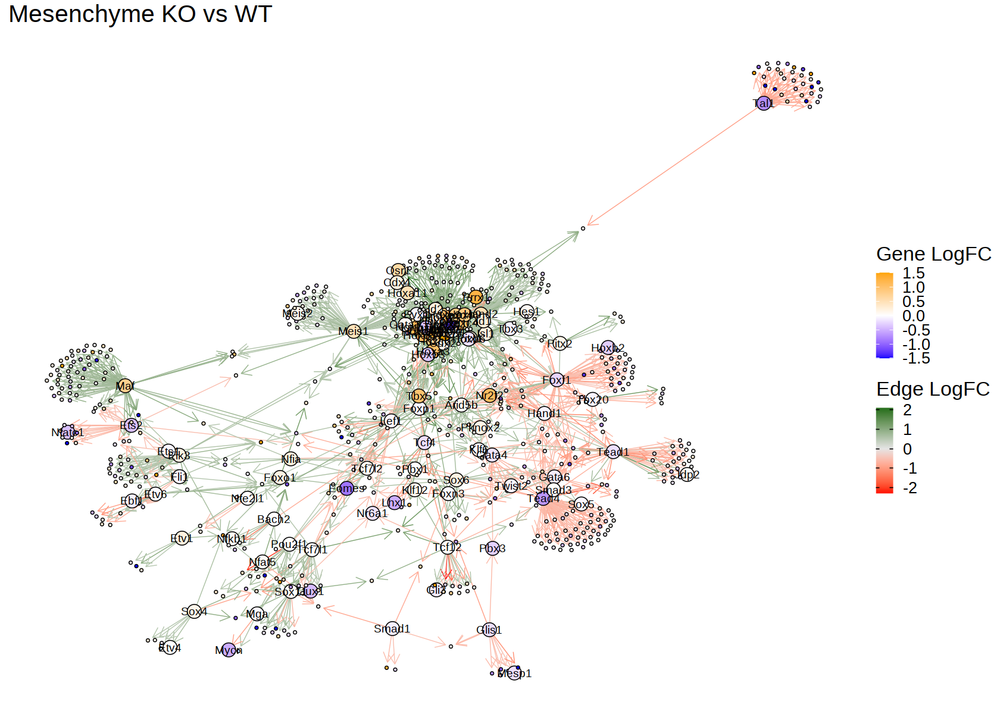

[[1]]
NULL

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL


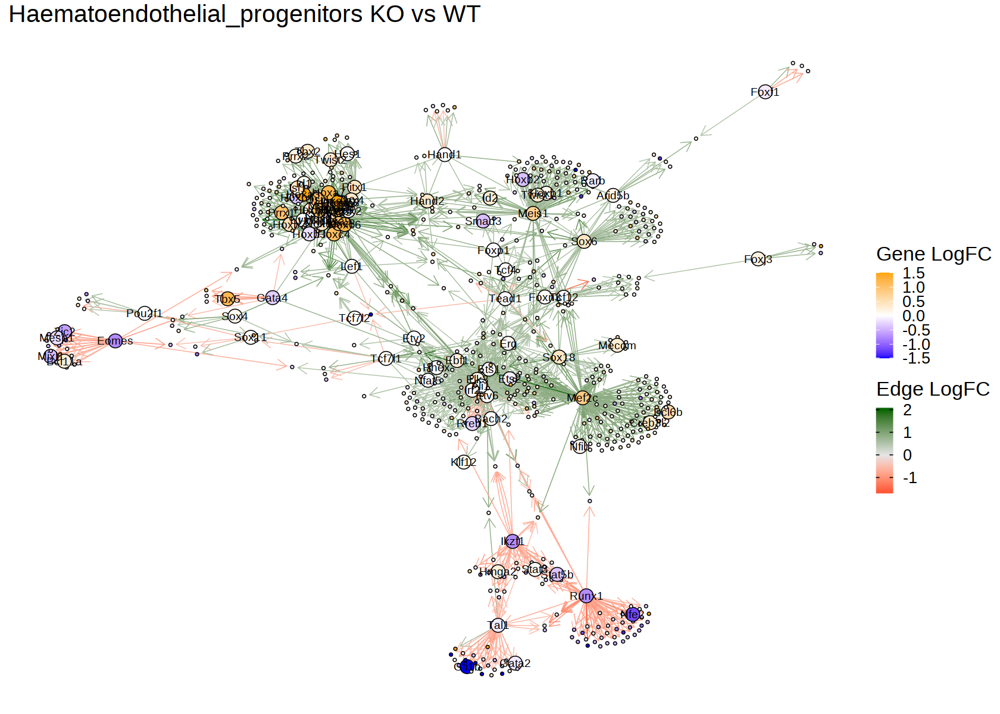

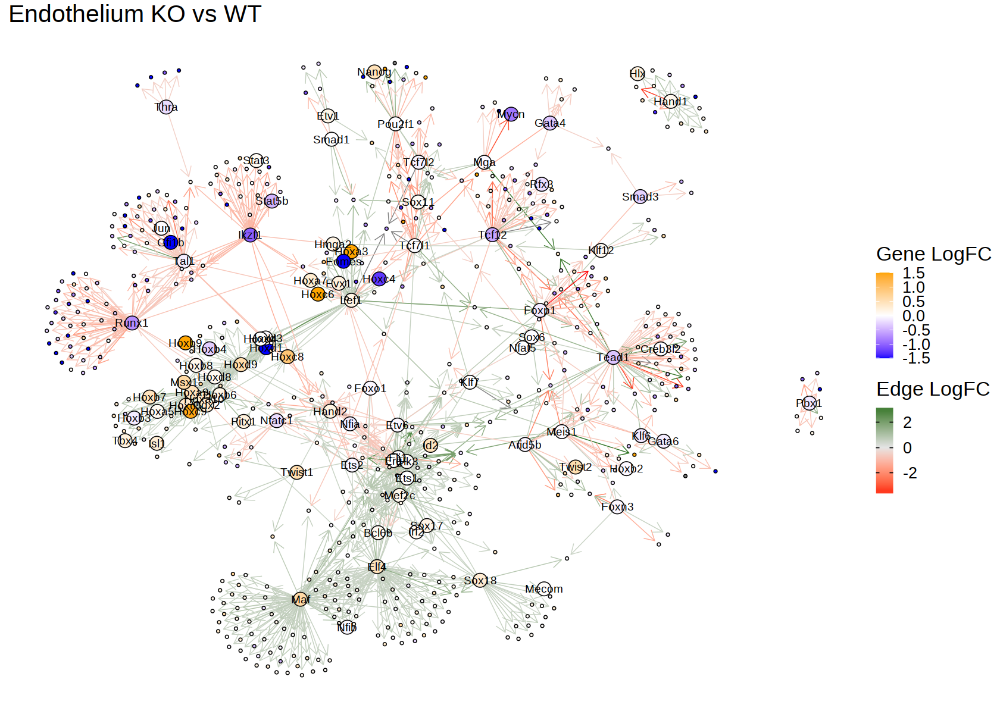

In [310]:
options(repr.plot.width=14, repr.plot.height=10)
lapply(celltypes.to.plot, function(x){ # celltypes.to.plot
    message(x)
    edge_stats = calc_edge_stats(x)
    if(!is.null(edge_stats)){
        plot_network(edge_stats, celltype_i=x)
    }
})

# Minmax normalisation! + no TF2G_rho

In [311]:
eGRN_small = eGRN_filt[,c('TF', 'Region', 'Gene', 'TF2G_rho')]

In [312]:
genes = unique(c(eGRN_filt$TF, eGRN_filt$Gene))
regions = unique(eGRN_filt$Region)

In [313]:
# Calculate edge weight for TF-TG based on:
# expr * acc * TF2G_importance
sample = 1
GRN_pseudobulk = lapply(1:length(colnames(rna_pseudobulk.sce)), function(sample){
    expr_tmp = as.data.table(logcounts(rna_pseudobulk.sce[genes, sample]), keep.rownames=T) %>% setnames(c('Gene', 'Expr'))
    acc_tmp = as.data.table(logcounts(atac_pseudobulk.sce[regions, sample]), keep.rownames=T) %>% setnames(c('Region', 'Acc'))

    edge_values_tmp = merge(eGRN_small, expr_tmp, by.x='TF', by.y='Gene') %>% merge(., acc_tmp, by='Region') %>%
        .[,edge_weight:=Expr * Acc] %>%
        .[,`:=`(genotype=atac_pseudobulk.sce[, sample]$genotype,
                 celltype=atac_pseudobulk.sce[, sample]$celltype,
                 sample=colnames(atac_pseudobulk.sce[, sample]))] %>%
        merge(.,expr_tmp %>% setnames(c('Gene', 'Gene_Expr')), by='Gene')
    return(edge_values_tmp)
}) %>% rbindlist()

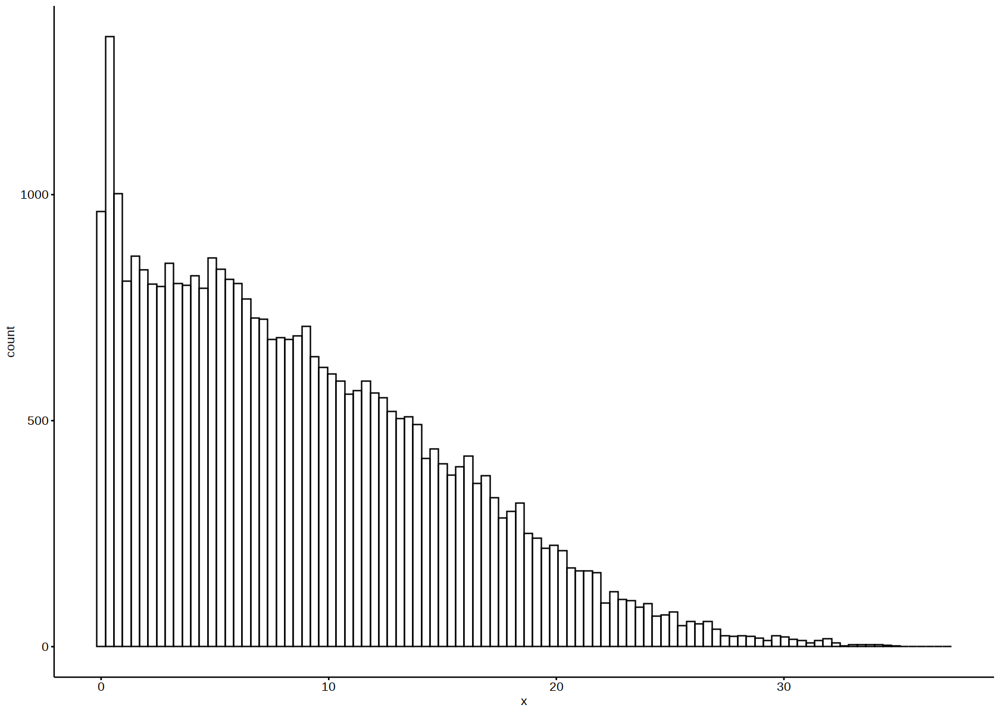

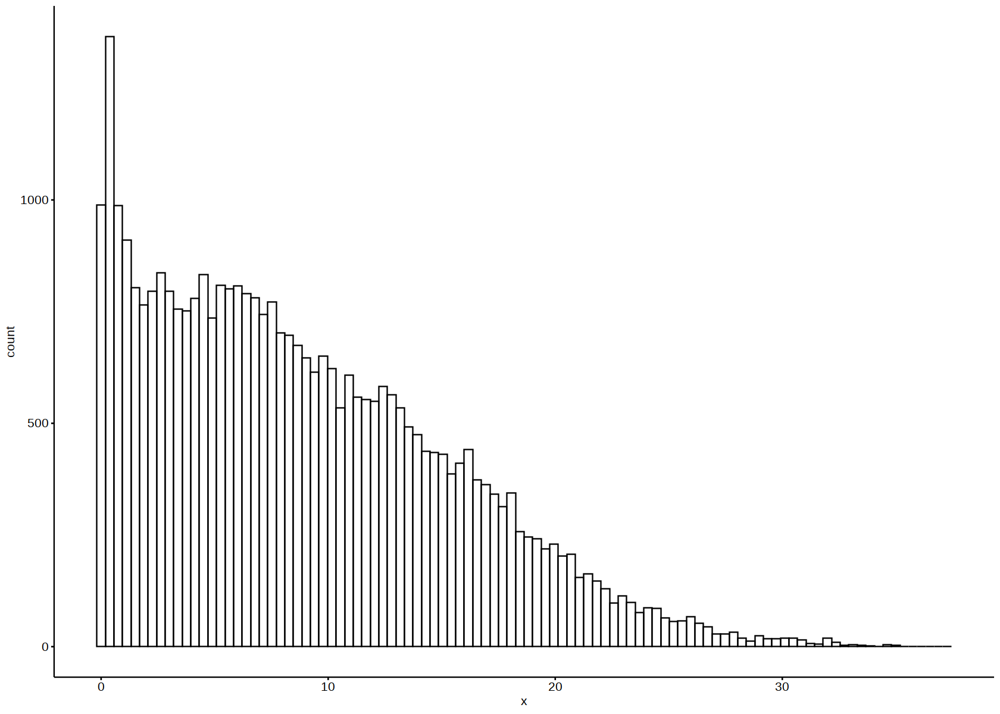

In [314]:
# Edge weight distribution
gghistogram(GRN_pseudobulk[sample == unique(sample)[1]]$edge_weight, bins=100)
gghistogram(GRN_pseudobulk[sample == unique(sample)[2]]$edge_weight, bins=100)

In [315]:
GRN_pseudobulk = GRN_pseudobulk[, `:=`(Expr_minmax=(Expr-min(Expr))/(max(Expr)-min(Expr)),
                             Acc_minmax=(Acc-min(Acc))/(max(Acc)-min(Acc)),
                             Gene_Expr_minmax=(Gene_Expr-min(Gene_Expr))/(max(Gene_Expr)-min(Gene_Expr))),
                             by='Gene'] %>%
                    .[,edge_weight:=Expr_minmax*Acc_minmax]

In [317]:
rna_pseudobulk.sce

class: SingleCellExperiment 
dim: 32285 110 
metadata(2): agg_pars n_cells
assays(2): counts logcounts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(110): Allantois-eomes_ko_rep1 Allantois-eomes_ko_rep2 ...
  Primitive_Streak-wt_rep4 Primitive_Streak-wt_rep5
colData names(0):
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [318]:
mean_TF_expr_wt = GRN_pseudobulk_wt[,c('TF', 'Expr')] %>% 
    .[, mean_expr:=mean(Expr), by='TF'] %>% 
    .[mean_expr>4, TF] %>% unique(by='TF')

In [319]:
mean_TF_expr

[1] "Ahctf1"  "Ahr"     "Arid3b"  "Arid5b"  "Arnt"    "Atf4"    "Atf6"   
  [8] "Atf6b"   "Atf7"    "Bach2"   "Clock"   "Creb3l2" "Ctcf"    "Cux1"   
 [15] "Cux2"    "E2f4"    "E2f7"    "Elf1"    "Eomes"   "Etv1"    "Etv4"   
 [22] "Etv5"    "Etv6"    "Evx1"    "Foxj3"   "Foxk1"   "Foxn2"   "Foxn3"  
 [29] "Foxo1"   "Foxo3"   "Foxp1"   "Foxp4"   "Glis1"   "Hdx"     "Hivep1" 
 [36] "Hmbox1"  "Hmg20b"  "Hmga2"   "Jun"     "Klf12"   "Klf13"   "Klf3"   
 [43] "Klf6"    "Klf7"    "Klf9"    "Lef1"    "Mecom"   "Mef2a"   "Mga"    
 [50] "Mixl1"   "Msx1"    "Myb"     "Nanog"   "Nfat5"   "Nfe2l1"  "Nfia"   
 [57] "Nfkb1"   "Nfya"    "Nfyc"    "Otx2"    "Patz1"   "Pbx1"    "Pbx3"   
 [64] "Pbx4"    "Phf21a"  "Pitx2"   "Plag1"   "Pou2f1"  "Pou3f1"  "Pou5f1" 
 [71] "Rest"    "Rfx3"    "Rfx7"    "Rora"    "Smad1"   "Smad2"   "Smad3"  
 [78] "Sox11"   "Sox2"    "Sox4"    "Sp2"     "Sp4"     "Sp8"     "T"      
 [85] "Tbx3"    "Tcf12"   "Tcf4"    "Tcf7l1"  "Tcf7l2"  "Tead1"   "Tead2"  
 [92] "Tfdp1"   "Tfdp2"   "Thra"    "Vezf1"   "Xbp1"    "Ybx1"    "Zfp219" 
 [99] "Zfp281"  "Zfp652"  "Zfx"     "Zic2"    "Zic3"    "Zic5"    "Zscan10"

In [320]:
calc_edge_stats = function(celltype_i = 'Mixed_mesoderm', min_edgeW, TF_expr_thr=4){
    min_edgeW = 0.4

    # Extract celltype-genotype GRN
    GRN_pseudobulk_ko = GRN_pseudobulk[celltype==celltype_i & genotype=='eomes_ko'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]
    GRN_pseudobulk_wt = GRN_pseudobulk[celltype==celltype_i & genotype=='wt'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]

    # Keep only TFs that are highly expressed
    mean_TF_expr_ko = GRN_pseudobulk_ko[,c('TF', 'Expr')] %>% 
        .[, mean_expr:=mean(Expr), by='TF'] %>% 
        .[mean_expr>TF_expr_thr, TF] %>% unique(by='TF')
    
    mean_TF_expr_wt = GRN_pseudobulk_wt[,c('TF', 'Expr')] %>% 
        .[, mean_expr:=mean(Expr), by='TF'] %>% 
        .[mean_expr>TF_expr_thr, TF] %>% unique(by='TF')
    
    keep_TFs = unique(c(mean_TF_expr_ko, mean_TF_expr_wt))
    GRN_pseudobulk_ko = GRN_pseudobulk_ko[TF %in% keep_TFs]
    GRN_pseudobulk_wt = GRN_pseudobulk_wt[TF %in% keep_TFs]

    
    if(nrow(GRN_pseudobulk_ko) != 0 & nrow(GRN_pseudobulk_wt) != 0){
    
    # keep only edges above certain weight in either KO or WT
    edges_keep = rbind(GRN_pseudobulk_ko[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')],
                          GRN_pseudobulk_wt[mean_edge_weight>=min_edgeW, c('TF', 'Region', 'Gene')]) %>%
                    unique(by=c('TF', 'Region', 'Gene')) %>% 
                    .[,idx:=.I]

    GRN_pseudobulk_ko = merge(edges_keep, GRN_pseudobulk_ko, by=c('TF', 'Region', 'Gene'))
    GRN_pseudobulk_wt = merge(edges_keep, GRN_pseudobulk_wt, by=c('TF', 'Region', 'Gene'))
    
    #lapply(unique(edges_keep$idx), function(x){
    edge_stats = lapply(unique(edges_keep$idx), function(x){
    ko_tmp = GRN_pseudobulk_ko[idx==x, edge_weight]
    wt_tmp = GRN_pseudobulk_wt[idx==x, edge_weight]

    tmp = data.table(TF = GRN_pseudobulk_ko[idx==x, TF][1], 
                     Region = GRN_pseudobulk_ko[idx==x, Region][1], 
                     Gene = GRN_pseudobulk_ko[idx==x, Gene][1], 
                     logFC = log2(abs(mean(ko_tmp)) / abs(mean(wt_tmp))),
                     TF_logFC = log2(abs(mean(GRN_pseudobulk_ko[idx==x, Expr_minmax])) / abs(mean(GRN_pseudobulk_wt[idx==x, Expr_minmax]))),
                     Gene_logFC = log2(abs(mean(GRN_pseudobulk_ko[idx==x, Gene_Expr_minmax])) / abs(mean(GRN_pseudobulk_wt[idx==x, Gene_Expr_minmax]))),
                     pvalue =  t.test(ko_tmp, wt_tmp, alternative ="two.sided")$p.value)
    }) %>% rbindlist() %>%
         .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
         .[order(FDR)] %>%
         .[,sig:=ifelse(FDR<0.05 & abs(logFC)>0.5, TRUE, FALSE)] %>%
         .[,logFC_capped:=ifelse(logFC<=-4, -4, ifelse(logFC>=4, 4, logFC))]

        return(edge_stats)
    }
}

In [371]:
plot_network = function(edge_stats = edge_stats, layout='fr', celltype_i='Mixed_mesoderm', keep_all=FALSE){
    ggplot(edge_stats, aes(logFC, -log10(FDR), col=sig)) + 
        geom_point() +
        theme_bw()
    
    edge_stats_filt = edge_stats[sig==TRUE][,N:=.N,by=TF][N>3]
    
    if(keep_all==FALSE){
        edge_stats_filt = edge_stats_filt %>% unique(by=c('TF','Gene'))    
    }
    
    nodes = rbind(edge_stats_filt[,c('TF', 'TF_logFC')] %>% setnames(c('gene', 'Gene_logFC')), 
                  edge_stats_filt[,c('Gene', 'Gene_logFC')]%>% setnames(c('gene', 'Gene_logFC'))) %>%
        unique(by='gene') %>%
        .[,type:=ifelse(gene %in% str_to_title(all_TFs), 'TF', 'target')] %>%
        .[,size:=ifelse(type=='TF', 4, 1.5)] %>%
        .[,Gene_logFC:=ifelse(Gene_logFC<= -1.5, -1.5, ifelse(Gene_logFC>=1.5, 1.5, Gene_logFC))] 

    igraph.tbl_tmp = tbl_graph(edges = edge_stats_filt[, c('TF', 'Gene', 'logFC')], nodes = nodes)

    ggraph(igraph.tbl_tmp, layout) + #'fr'
        # Edges
            geom_edge_fan(aes( edge_color=logFC), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, 
            scale_edge_alpha_continuous(range=c(0,1), name='abs(edge logFC)') +
            scale_edge_colour_gradient2(low='red', mid='white', high='darkgreen', name='Edge LogFC') +
            # Nodes
            geom_node_point(aes(fill=Gene_logFC, size=size), shape=21) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
            geom_node_text(aes(filter=type=='TF', label=gene)) + # , size=3.75| type=='target'
            scale_fill_gradient2(low='blue', mid='white', high='orange', name='Gene LogFC') +
            scale_size_continuous(range(1,2), guide='none') + 
            # theme
            theme_graph() + theme(
                    legend.position = "right",
                    text=element_text(size=20)) + 
            ggtitle(paste(celltype_i, 'KO vs WT'))
}

In [322]:
edge_stats = calc_edge_stats('Primitive_Streak')

Warning message:
“Using `bins = 30` by default. Pick better value with the argument `bins`.”


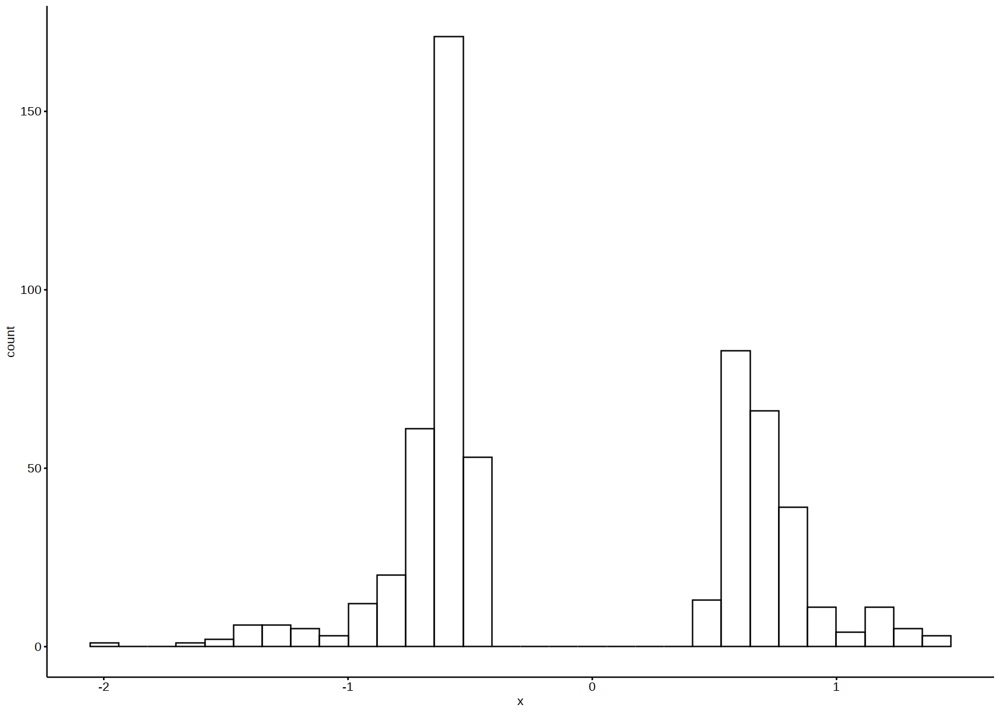

In [352]:
gghistogram(edge_stats[sig==TRUE]$logFC)

Epiblast

Primitive_Streak

Nascent_mesoderm

Mixed_mesoderm

ExE_mesoderm

Allantois

Mesenchyme

Haematoendothelial_progenitors

Endothelium

Blood_progenitors_1

Blood_progenitors_2

Erythroid1

Erythroid2

Erythroid3



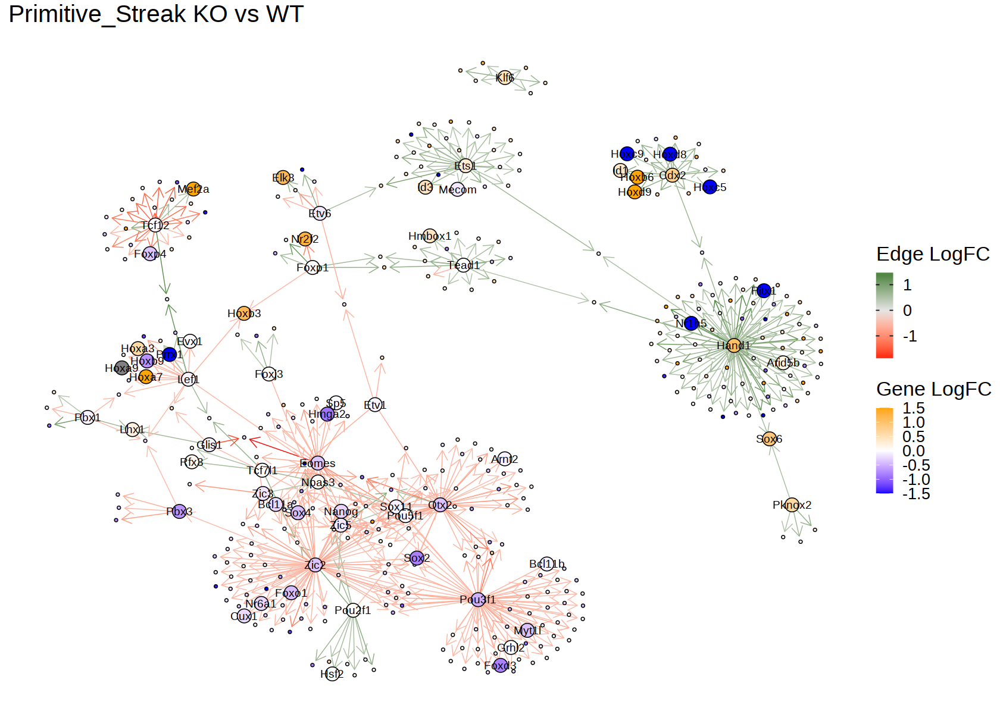

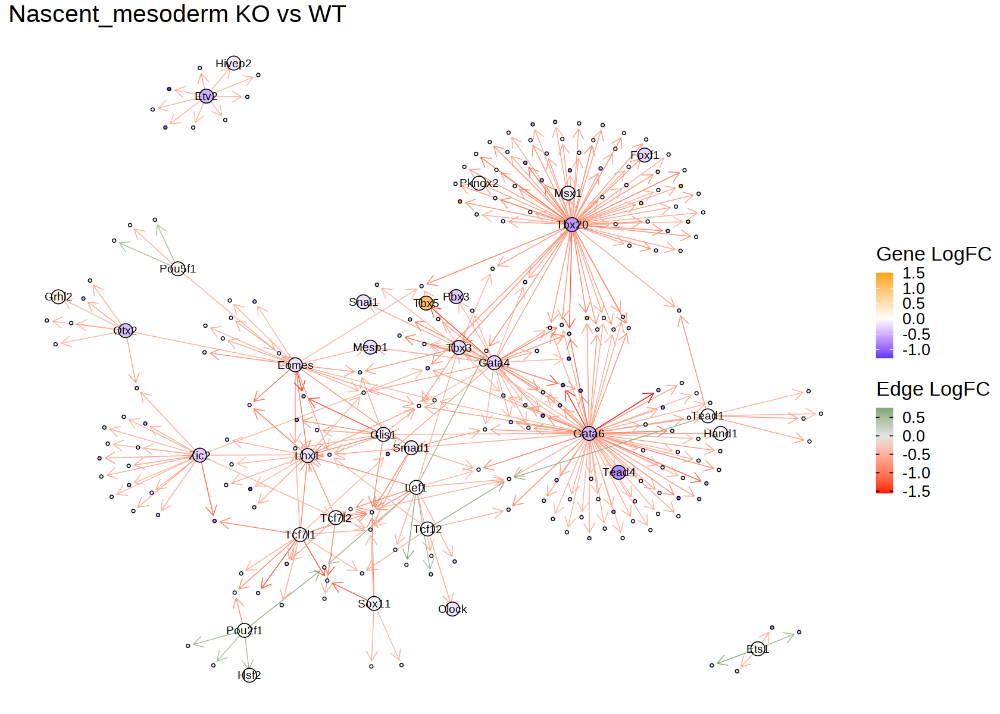

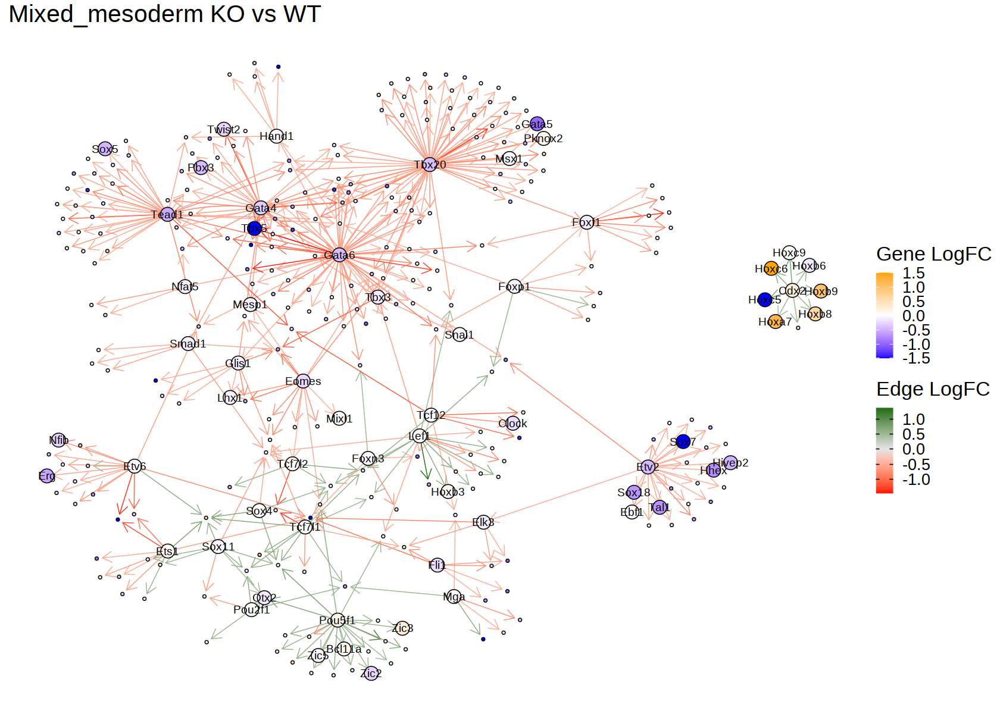

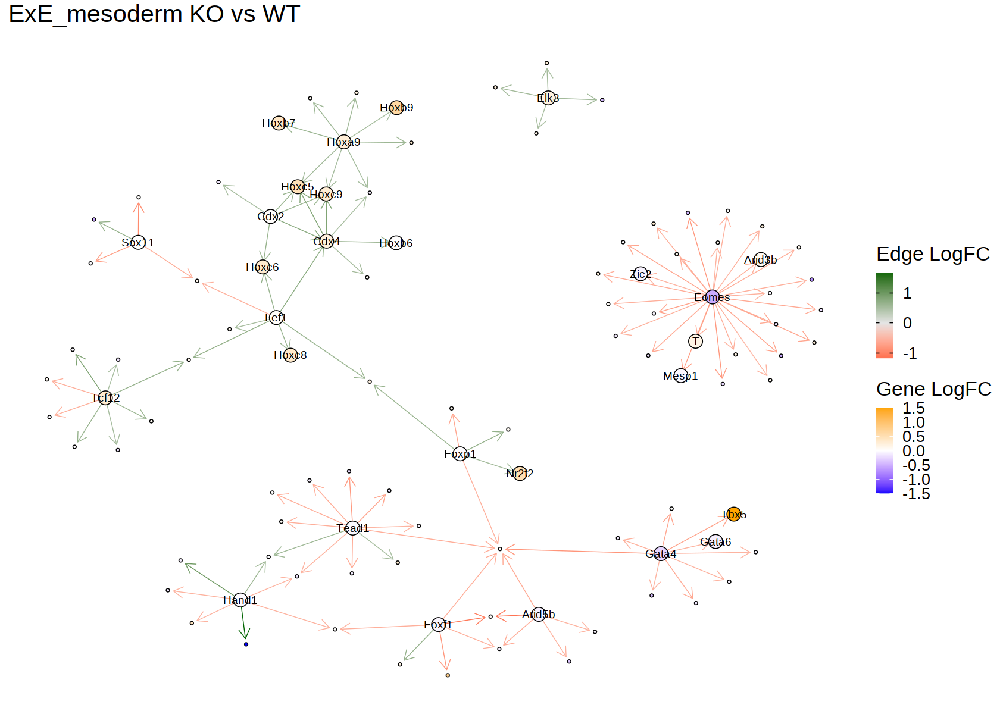

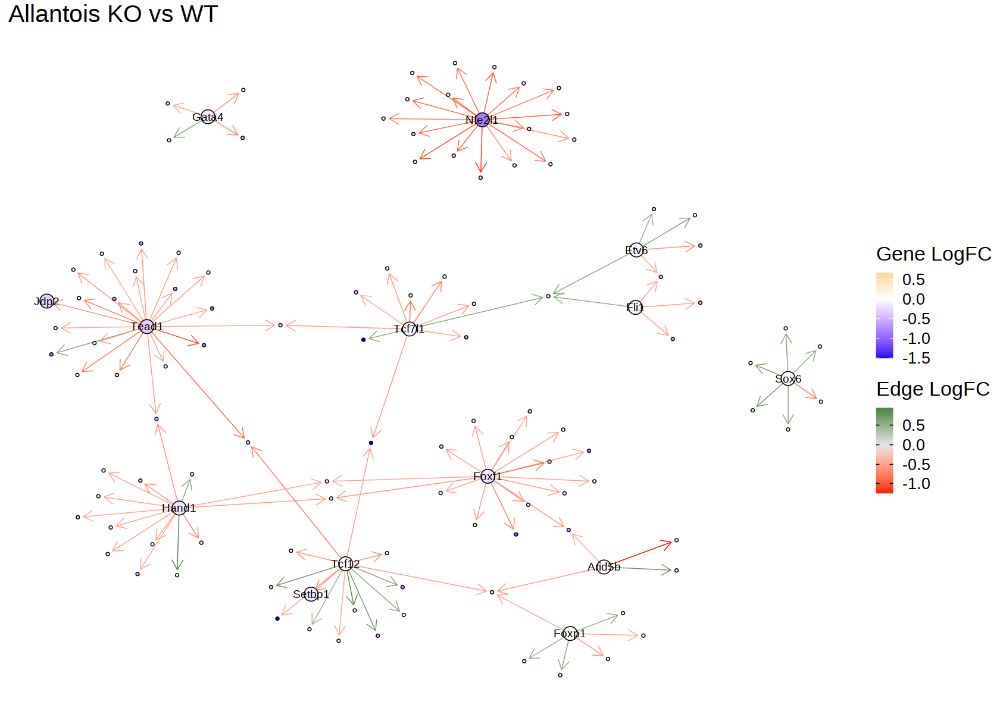

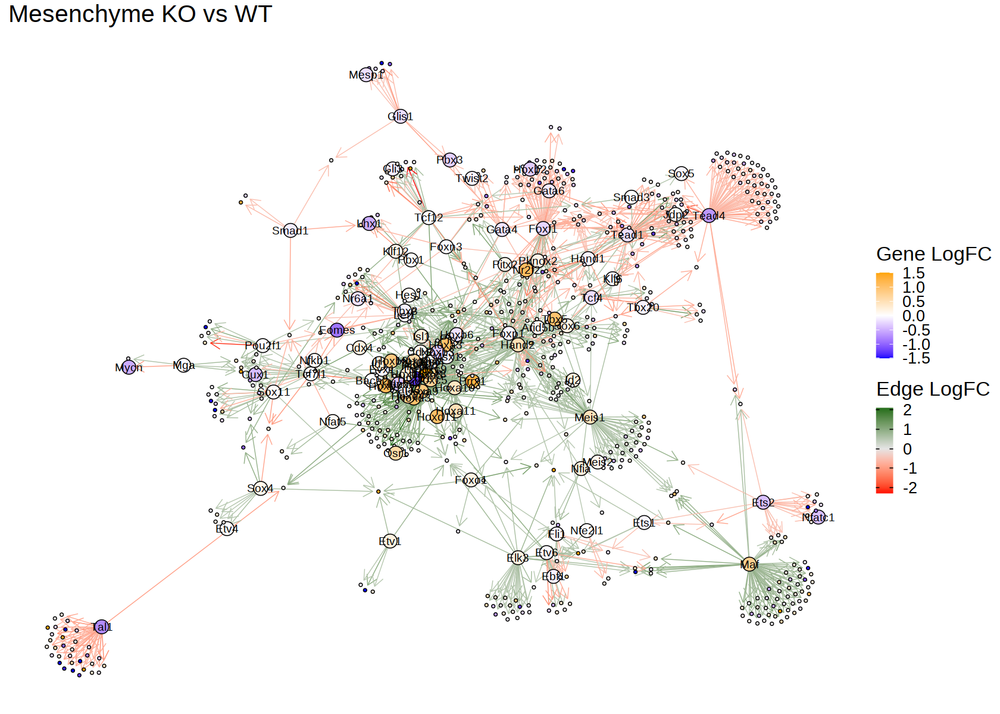

[[1]]
NULL

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL


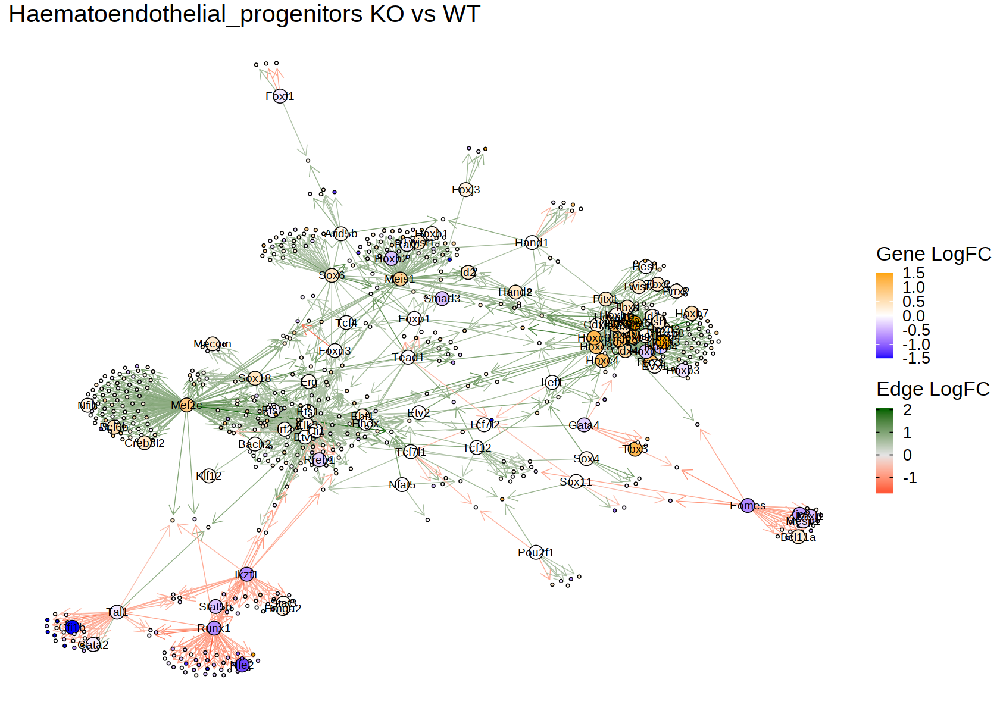

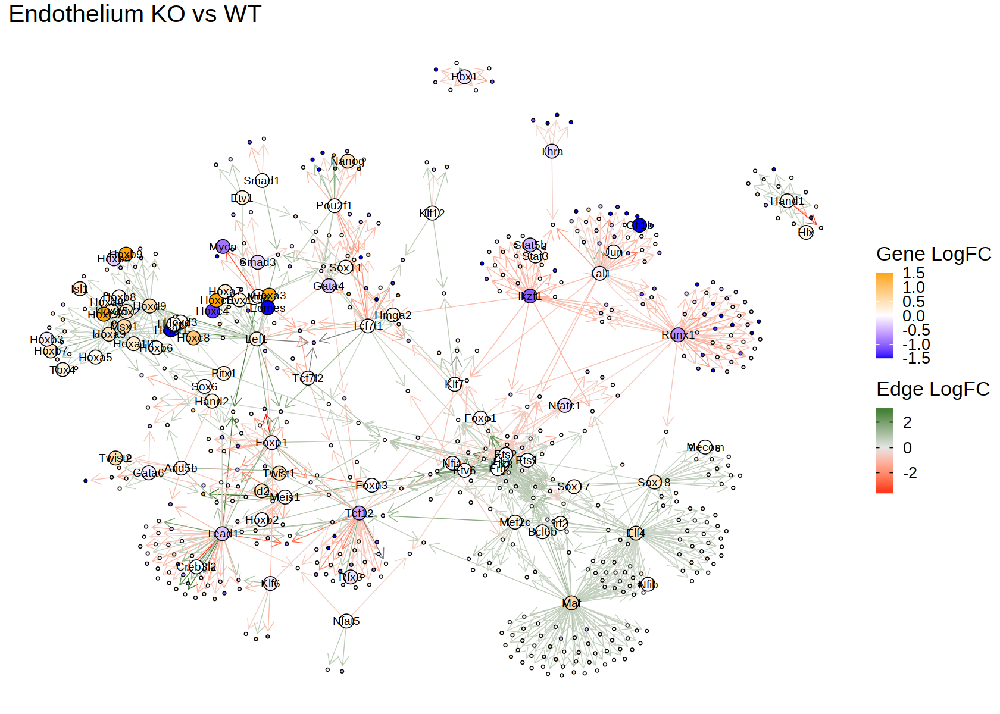

In [327]:
options(repr.plot.width=14, repr.plot.height=10)
lapply(celltypes.to.plot, function(x){ # celltypes.to.plot
    message(x)
    edge_stats = calc_edge_stats(x)
    if(!is.null(edge_stats)){
        plot_network(edge_stats, celltype_i=x)
    }
})

In [432]:
plot_network = function(edge_stats = edge_stats, layout='fr', celltype_i='Mixed_mesoderm', keep_all=FALSE){
    ggplot(edge_stats, aes(logFC, -log10(FDR), col=sig)) + 
        geom_point() +
        theme_bw()
    
    edge_stats_filt = edge_stats[sig==TRUE][,N:=.N,by=TF][N>3]
    
    if(keep_all==FALSE){
        edge_stats_filt = edge_stats_filt %>% unique(by=c('TF','Gene'))    
    }
    
    nodes = rbind(edge_stats_filt[,c('TF', 'TF_logFC')] %>% setnames(c('gene', 'Gene_logFC')), 
                  edge_stats_filt[,c('Gene', 'Gene_logFC')]%>% setnames(c('gene', 'Gene_logFC'))) %>%
        unique(by='gene') %>%
        .[,type:=ifelse(gene %in% str_to_title(all_TFs), 'TF', 'target')] %>%
        .[,size:=ifelse(type=='TF', 4, 1.5)] %>%
        .[,Gene_logFC:=ifelse(Gene_logFC<= -1.5, -1.5, ifelse(Gene_logFC>=1.5, 1.5, Gene_logFC))] 

    igraph.tbl_tmp = tbl_graph(edges = edge_stats_filt[, c('TF', 'Gene', 'logFC')], nodes = nodes)

    ggraph(igraph.tbl_tmp, layout) + #'fr'
        # Edges
            geom_edge_fan(aes( edge_color=2^logFC), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, 
            scale_edge_alpha_continuous(range=c(0,1), name='abs(edge logFC)') +
            scale_edge_colour_gradient2(mid='red', high='darkgreen', name='Edge LogFC') +
            # Nodes
            geom_node_point(aes(fill=2^Gene_logFC, size=size), shape=21) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
            geom_node_text(aes(filter=type=='TF', label=gene)) + # , size=3.75| type=='target'
            scale_fill_gradient2(low='blue', mid='white', high='orange', name='Gene LogFC') +
            scale_size_continuous(range(1,2), guide='none') + 
            # theme
            theme_graph() + theme(
                    legend.position = "right",
                    text=element_text(size=20)) + 
            ggtitle(paste(celltype_i, 'KO vs WT'))
}

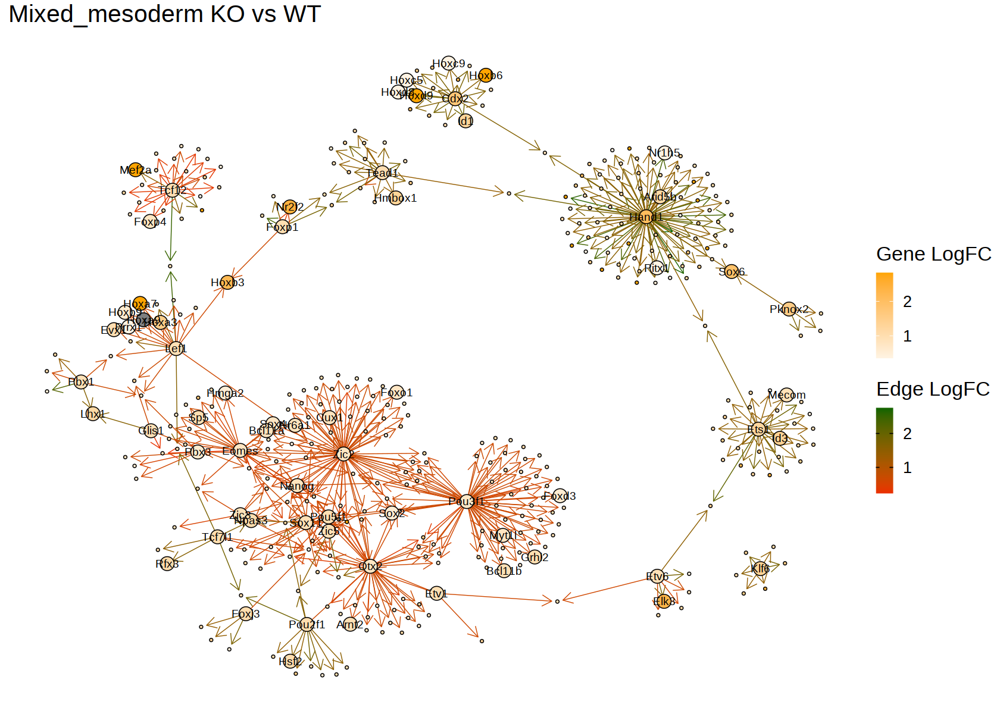

In [433]:
plot_network(edge_stats)

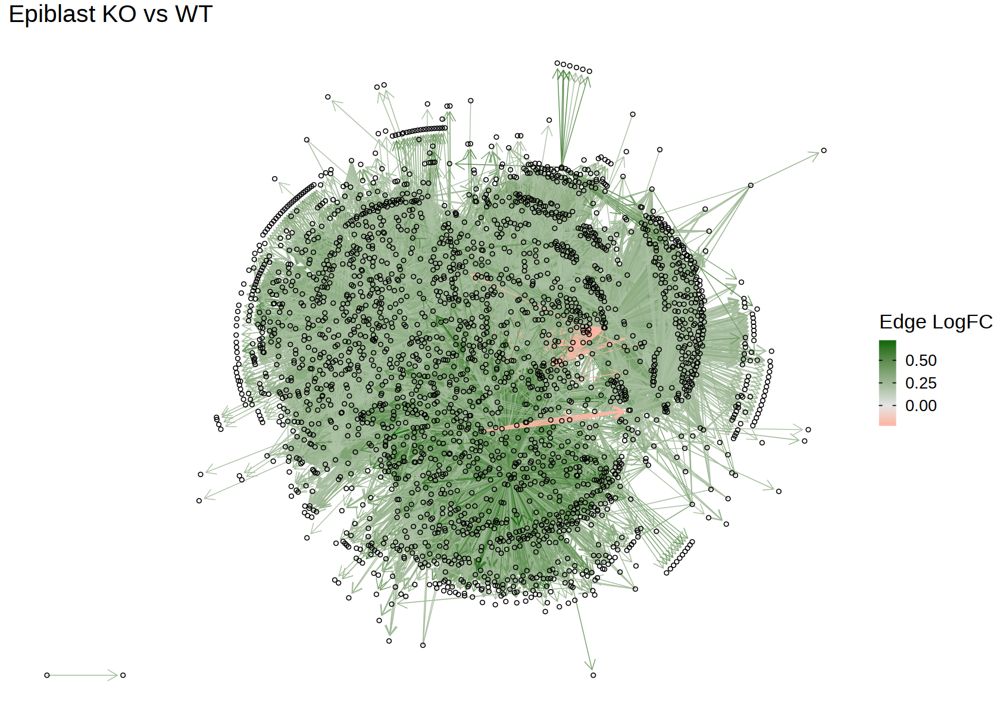

In [334]:
igraph.tbl_tmp = tbl_graph(edges = eGRN_small[, c('TF', 'Gene', 'TF2G_rho')])

ggraph(igraph.tbl_tmp, 'stress') +  #'fr'
    # Edges
        geom_edge_fan(aes( edge_color=TF2G_rho), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_colour_gradient2(low='red', mid='grey90', high='darkgreen', name='Edge LogFC') +
        # Nodes
        geom_node_point(shape=21) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far

        # theme
        theme_graph() + theme(
                legend.position = "right",
                text=element_text(size=20)) + 
        ggtitle(paste(celltype_i, 'KO vs WT'))

In [337]:
test = merge(eGRN_small, edge_stats, by=c('TF', 'Region', 'Gene'), all.x=TRUE)[,c('TF', 'Gene', 'logFC')]

In [342]:
test$logFC = ifelse(is.na(test$logFC), 0, test$logFC)

In [346]:
test = test[order(abs(logFC))]

In [347]:
igraph.tbl_tmp = tbl_graph(edges = test)

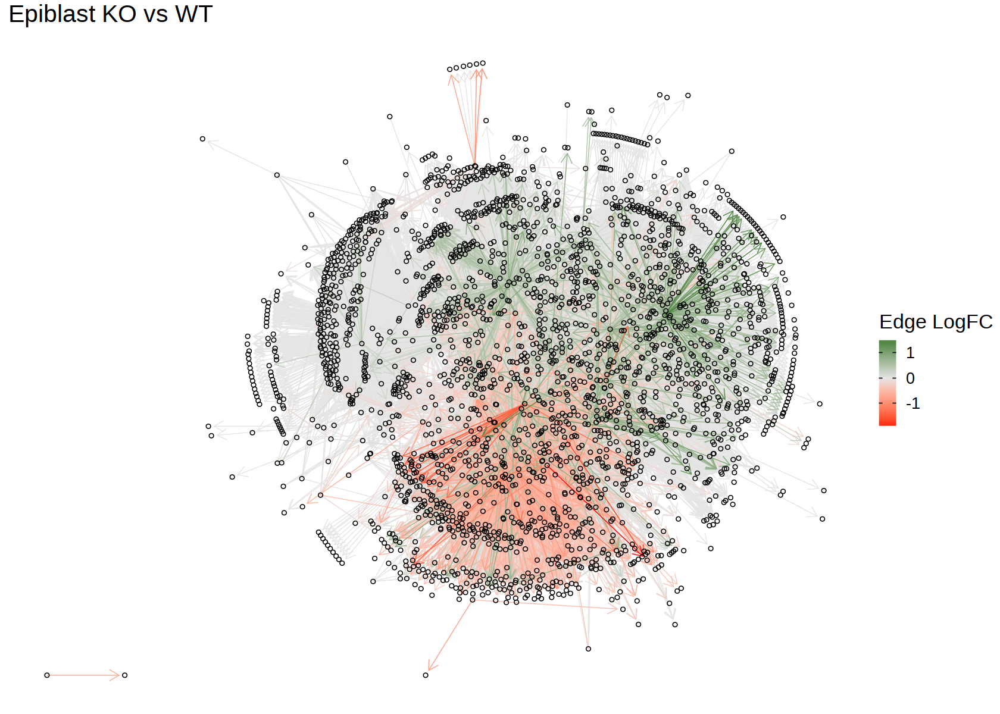

In [348]:
ggraph(igraph.tbl_tmp, 'stress') +  #'fr'
    # Edges
        geom_edge_fan(aes( edge_color=logFC), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_colour_gradient2(low='red', mid='grey90', high='darkgreen', name='Edge LogFC') +
        # Nodes
        geom_node_point(shape=21) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far

        # theme
        theme_graph() + theme(
                legend.position = "right",
                text=element_text(size=20)) + 
        ggtitle(paste(celltype_i, 'KO vs WT'))

In [388]:
TF_expr_thr = 4
celltype_i = 'Endothelium'
GRN_pseudobulk_ko = GRN_pseudobulk[celltype==celltype_i & genotype=='eomes_ko'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]
    GRN_pseudobulk_wt = GRN_pseudobulk[celltype==celltype_i & genotype=='wt'] %>% 
        .[,mean_edge_weight:=mean(edge_weight), by=c('TF', 'Region', 'Gene', 'sample')]

    # Keep only TFs that are highly expressed
    mean_TF_expr_ko = GRN_pseudobulk_ko[,c('TF', 'Expr')] %>% 
        .[, mean_expr:=mean(Expr), by='TF'] %>% 
        .[mean_expr>TF_expr_thr, TF] %>% unique(by='TF')
    
    mean_TF_expr_wt = GRN_pseudobulk_wt[,c('TF', 'Expr')] %>% 
        .[, mean_expr:=mean(Expr), by='TF'] %>% 
        .[mean_expr>TF_expr_thr, TF] %>% unique(by='TF')
    
    keep_TFs = unique(c(mean_TF_expr_ko, mean_TF_expr_wt))
    GRN_pseudobulk_ko = GRN_pseudobulk_ko[TF %in% keep_TFs]
    GRN_pseudobulk_wt = GRN_pseudobulk_wt[TF %in% keep_TFs]

In [415]:
head(GRN_pseudobulk_ko[Gene == 'Nanog'] %>% unique(by='sample'))
head(GRN_pseudobulk_wt[Gene == 'Nanog'] %>% unique(by='sample'))

Gene,Region,TF,TF2G_rho,Expr,Acc,edge_weight,genotype,celltype,sample,Gene_Expr,Expr_minmax,Acc_minmax,Gene_Expr_minmax,mean_edge_weight
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Nanog,chr6:122670129-122670729,Etv1,0.2683777,5.307424,1.1237642,0.2257222,eomes_ko,Endothelium,Endothelium-eomes_ko_rep1,0.7780510,0.6025531,0.3746096,0.1231449,0.2257222
Nanog,chr6:122670129-122670729,Etv1,0.2683777,5.661911,0.9309947,0.1994920,eomes_ko,Endothelium,Endothelium-eomes_ko_rep2,1.2738084,0.6427981,0.3103494,0.2016102,0.1994920
Nanog,chr6:122670129-122670729,Etv1,0.2683777,5.009272,0.8354751,0.1583884,eomes_ko,Endothelium,Endothelium-eomes_ko_rep3,0.7346245,0.5687038,0.2785077,0.1162716,0.1583884
Nanog,chr6:122670129-122670729,Etv1,0.2683777,5.497005,0.7781839,0.1618914,eomes_ko,Endothelium,Endothelium-eomes_ko_rep4,1.2380531,0.6240763,0.2594095,0.1959511,0.1618914
Nanog,chr6:122670129-122670729,Etv1,0.2683777,5.320747,1.0014195,0.2016526,eomes_ko,Endothelium,Endothelium-eomes_ko_rep5,0.0000000,0.6040657,0.3338257,0.0000000,0.2016526


Gene,Region,TF,TF2G_rho,Expr,Acc,edge_weight,genotype,celltype,sample,Gene_Expr,Expr_minmax,Acc_minmax,Gene_Expr_minmax,mean_edge_weight
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Nanog,chr6:122670129-122670729,Etv1,0.2683777,4.820861,1.0483809,0.1912753,wt,Endothelium,Endothelium-wt_rep1,0.0000000,0.5473135,0.3494804,0.0000000,0.1912753
Nanog,chr6:122670129-122670729,Etv1,0.2683777,4.694055,1.4848322,0.2637794,wt,Endothelium,Endothelium-wt_rep2,1.3009058,0.5329172,0.4949725,0.2058990,0.2637794
Nanog,chr6:122670129-122670729,Etv1,0.2683777,4.678171,0.8678368,0.1536489,wt,Endothelium,Endothelium-wt_rep3,0.8227750,0.5311139,0.2892956,0.1302235,0.1536489
Nanog,chr6:122670129-122670729,Etv1,0.2683777,4.774787,1.6346848,0.2953951,wt,Endothelium,Endothelium-wt_rep4,0.7763884,0.5420826,0.5449263,0.1228818,0.2953951
Nanog,chr6:122670129-122670729,Etv1,0.2683777,5.160442,1.2589262,0.2458682,wt,Endothelium,Endothelium-wt_rep5,0.0000000,0.5858662,0.4196662,0.0000000,0.2458682


In [409]:
unique(GRN_pseudobulk_wt$sample)

[1] "Endothelium-wt_rep1" "Endothelium-wt_rep2" "Endothelium-wt_rep3"
[4] "Endothelium-wt_rep4" "Endothelium-wt_rep5"

Warning message:
“Using `bins = 30` by default. Pick better value with the argument `bins`.”


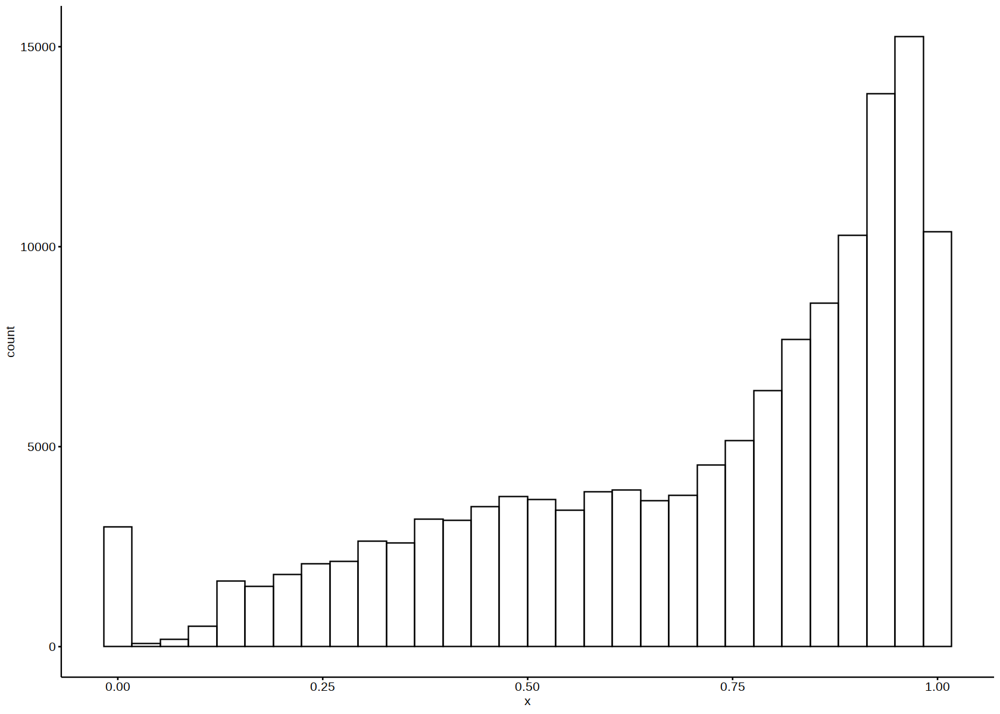

In [406]:
gghistogram(GRN_pseudobulk_wt$Gene_Expr_minmax)